**Блок 1. Загрузка и нормализация сигнала**

In [1]:
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy.io import wavfile
from IPython.display import Audio, display
import warnings
import soundfile as sf
warnings.filterwarnings('ignore')

In [2]:
AUDIO_PATH = "audio_fr.wav" #загружаем сигнал

In [3]:
y_raw, sr_original = librosa.load(AUDIO_PATH, sr=None, mono=False)

In [4]:
print("исходный аудиосигнал:")
print(f"Шейп массив: {y_raw.shape}")
print(f"Тип данных:            {y_raw.dtype}")
print(f"Исходная частота:      {sr_original}")
print(f"Длина в секундах:      {y_raw.shape[-1] / sr_original:.2f}")

исходный аудиосигнал:
Шейп массив: (2, 3498843)
Тип данных:            float32
Исходная частота:      44100
Длина в секундах:      79.34


In [5]:
is_stereo = y_raw.ndim == 2
print(f"Каналов:               {'2 (стерео)' if is_stereo else '1 (моно)'}")

Каналов:               2 (стерео)


In [6]:
if is_stereo:
    y_mono = librosa.to_mono(y_raw)
    print("стерео в моно (усреднение L+R каналов)")
else:
    y_mono = y_raw.copy()
    print("файл уже моно, конвертация не нужна")
print(f"Форма после to_mono:   {y_mono.shape}")

стерео в моно (усреднение L+R каналов)
Форма после to_mono:   (3498843,)


In [7]:
TARGET_SR = 22050
y_resampled = librosa.resample(y_mono, orig_sr=sr_original, target_sr=TARGET_SR) #даунсеплинг

In [8]:
print(f"Исходная частота:      {sr_original} Гц в {y_mono.shape[0]} сэмплов")
print(f"Целевая частота:       {TARGET_SR} Гц  в {y_resampled.shape[0]} сэмплов")
print(f"Коэффициент сжатия:    {sr_original / TARGET_SR:.1f}x")
print(f"Ускорение обработки:   ~{sr_original / TARGET_SR:.0f} раза меньше данных")

Исходная частота:      44100 Гц в 3498843 сэмплов
Целевая частота:       22050 Гц  в 1749422 сэмплов
Коэффициент сжатия:    2.0x
Ускорение обработки:   ~2 раза меньше данных


In [9]:
def normalize_audio(signal: np.ndarray) -> np.ndarray:
    """Нормализация: делим на максимум абсолютного значения."""
    peak = np.max(np.abs(signal))
    if peak == 0:
        return signal  # тишина — не делим на 0
    return signal / peak

y_normalized = normalize_audio(y_resampled)
print("нормализация:")
print(f"До нормализации    min: {y_resampled.min():.4f}, max: {y_resampled.max():.4f}")
print(f"После нормализации min: {y_normalized.min():.4f}, max: {y_normalized.max():.4f}")

нормализация:
До нормализации    min: -1.0124, max: 1.0382
После нормализации min: -0.9751, max: 1.0000


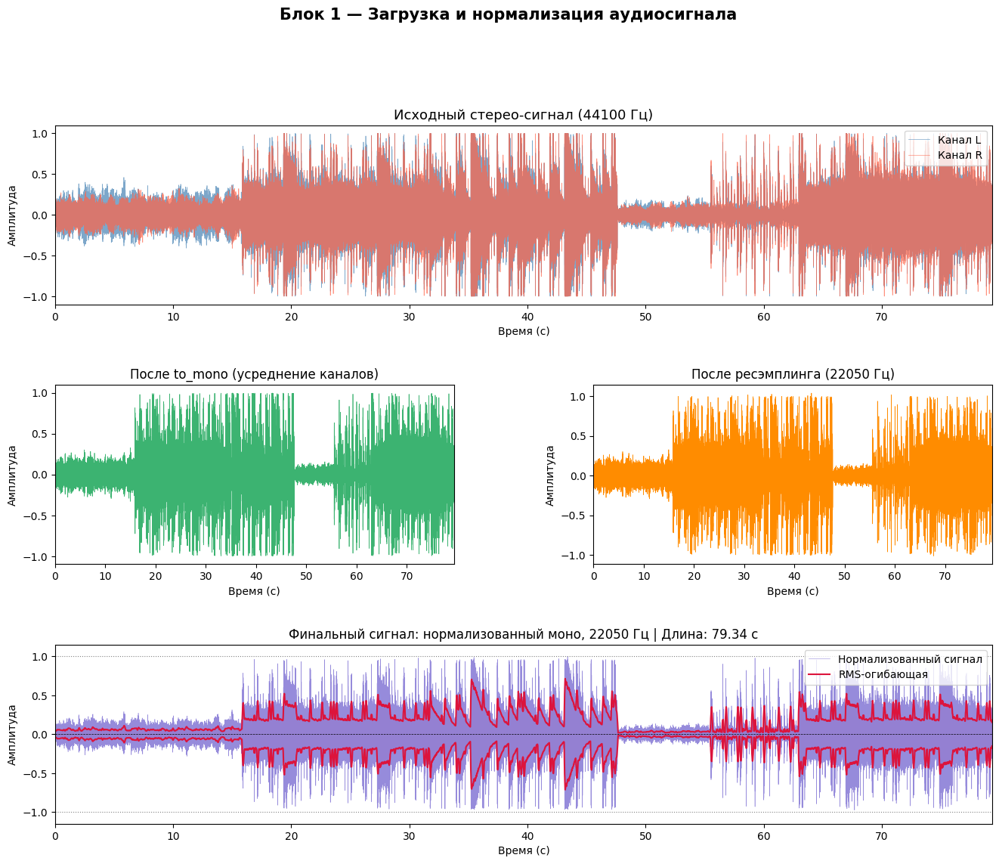

In [10]:
# визуализация макро
fig = plt.figure(figsize=(16, 12))
gs  = gridspec.GridSpec(3, 2, figure=fig, hspace=0.45, wspace=0.35)

# Ось времени (в секундах)
t_original  = np.linspace(0, len(y_mono) / sr_original, len(y_mono))
t_resampled = np.linspace(0, len(y_normalized) / TARGET_SR, len(y_normalized))

# График 1: Стерео-каналы
ax1 = fig.add_subplot(gs[0, :])
if is_stereo:
    t_stereo = np.linspace(0, y_raw.shape[1] / sr_original, y_raw.shape[1])
    ax1.plot(t_stereo, y_raw[0], color='steelblue', alpha=0.7, linewidth=0.5, label='Канал L')
    ax1.plot(t_stereo, y_raw[1], color='tomato', alpha=0.7, linewidth=0.5, label='Канал R')
    ax1.legend(loc='upper right')
    ax1.set_title(f'Исходный стерео-сигнал ({sr_original} Гц)', fontsize=13)
else:
    ax1.plot(t_original, y_mono, color='steelblue', linewidth=0.5)
    ax1.set_title(f'Исходный моно-сигнал ({sr_original} Гц)', fontsize=13)
ax1.set_xlabel('Время (с)')
ax1.set_ylabel('Амплитуда')
ax1.set_xlim(0, t_original[-1])

# График 2: После сведения в моно
ax2 = fig.add_subplot(gs[1, 0])
ax2.plot(t_original, y_mono, color='mediumseagreen', linewidth=0.5)
ax2.set_title('После to_mono (усреднение каналов)', fontsize=12)
ax2.set_xlabel('Время (с)')
ax2.set_ylabel('Амплитуда')
ax2.set_xlim(0, t_original[-1])

# График 3: После даунсэмплинга
ax3 = fig.add_subplot(gs[1, 1])
ax3.plot(t_resampled, y_resampled, color='darkorange', linewidth=0.5)
ax3.set_title(f'После ресэмплинга ({TARGET_SR} Гц)', fontsize=12)
ax3.set_xlabel('Время (с)')
ax3.set_ylabel('Амплитуда')
ax3.set_xlim(0, t_resampled[-1])

# График 4: Нормализованный + RMS-огибающая
ax4 = fig.add_subplot(gs[2, :])
ax4.plot(t_resampled, y_normalized, color='slateblue', linewidth=0.4, alpha=0.7, label='Нормализованный сигнал')

# Вычисление RMS (Root Mean Square)
frame_length = 2048
hop_length   = 512
rms = librosa.feature.rms(y=y_normalized, frame_length=frame_length, hop_length=hop_length)[0]
t_rms = librosa.frames_to_time(np.arange(len(rms)), sr=TARGET_SR, hop_length=hop_length)

ax4.plot(t_rms,  rms, color='crimson', linewidth=1.5, label='RMS-огибающая')
ax4.plot(t_rms, -rms, color='crimson', linewidth=1.5)
ax4.fill_between(t_rms,  rms, -rms, alpha=0.15, color='crimson')

ax4.axhline(0,  color='black', linewidth=0.5, linestyle='--')
ax4.axhline(1,  color='gray',  linewidth=0.8, linestyle=':')
ax4.axhline(-1, color='gray',  linewidth=0.8, linestyle=':')

ax4.set_title(f'Финальный сигнал: нормализованный моно, {TARGET_SR} Гц | Длина: {len(y_normalized)/TARGET_SR:.2f} с', fontsize=12)
ax4.set_xlabel('Время (с)')
ax4.set_ylabel('Амплитуда')
ax4.set_xlim(0, t_resampled[-1])
ax4.set_ylim(-1.15, 1.15)
ax4.legend(loc='upper right')

plt.suptitle('Блок 1 — Загрузка и нормализация аудиосигнала', fontsize=15, fontweight='bold', y=1.01)
plt.savefig('block1_waveform.png', dpi=150, bbox_inches='tight')
plt.show()

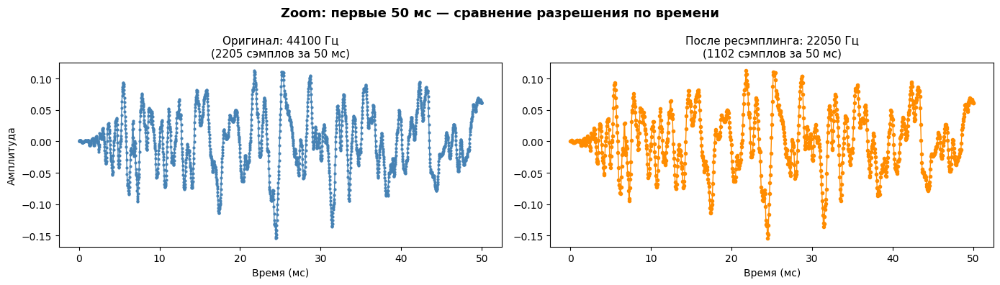

In [11]:
# визуализация микро под влиянием ресемплинга
ZOOM_MS = 50
zoom_orig  = int(sr_original * ZOOM_MS / 1000)
zoom_resmp = int(TARGET_SR   * ZOOM_MS / 1000)

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
fig.suptitle(f'Zoom: первые {ZOOM_MS} мс — сравнение разрешения по времени', fontsize=13, fontweight='bold')

t_z_orig  = np.linspace(0, ZOOM_MS, zoom_orig)
t_z_resmp = np.linspace(0, ZOOM_MS, zoom_resmp)

axes[0].plot(t_z_orig, y_mono[:zoom_orig], 'o-', color='steelblue', markersize=2, linewidth=1)
axes[0].set_title(f'Оригинал: {sr_original} Гц\n({zoom_orig} сэмплов за {ZOOM_MS} мс)', fontsize=11)
axes[0].set_xlabel('Время (мс)')
axes[0].set_ylabel('Амплитуда')

axes[1].plot(t_z_resmp, y_resampled[:zoom_resmp], 'o-', color='darkorange', markersize=3, linewidth=1)
axes[1].set_title(f'После ресэмплинга: {TARGET_SR} Гц\n({zoom_resmp} сэмплов за {ZOOM_MS} мс)', fontsize=11)
axes[1].set_xlabel('Время (мс)')

plt.tight_layout()
plt.savefig('block1_zoom.png', dpi=150, bbox_inches='tight')
plt.show()

In [12]:
# итог и прослушка
duration = len(y_normalized) / TARGET_SR
size_mb_orig  = y_mono.nbytes / 1024**2
size_mb_final = y_normalized.nbytes / 1024**2

print("  ИТОГ БЛОКА 1 — параметры финального сигнала")

print(f"  Каналы:           моно")
print(f"  Частота:          {TARGET_SR} Гц")
print(f"  Длина:            {duration:.2f} с  ({len(y_normalized)} сэмплов)")
print(f"  Диапазон:         [{y_normalized.min():.4f}, {y_normalized.max():.4f}]")
print(f"  Размер в памяти:  {size_mb_final:.2f} МБ  (было {size_mb_orig:.2f} МБ, экономия {(1 - size_mb_final/size_mb_orig)*100:.0f}%)")

print(f"\nОбоснование TARGET_SR = {TARGET_SR} Гц:")
print(f"По теореме Котельникова, восстанавливаются частоты до {TARGET_SR//2} Гц.")
print(f"Shazam (Wang03) использовал 8000 Гц. Мы используем {TARGET_SR} Гц — ")
print(f"это дает баланс между качеством для нейросети и скоростью вычислений.")

# прослушка сигнала
display(Audio(data=y_normalized, rate=TARGET_SR))

  ИТОГ БЛОКА 1 — параметры финального сигнала
  Каналы:           моно
  Частота:          22050 Гц
  Длина:            79.34 с  (1749422 сэмплов)
  Диапазон:         [-0.9751, 1.0000]
  Размер в памяти:  6.67 МБ  (было 13.35 МБ, экономия 50%)

Обоснование TARGET_SR = 22050 Гц:
По теореме Котельникова, восстанавливаются частоты до 11025 Гц.
Shazam (Wang03) использовал 8000 Гц. Мы используем 22050 Гц — 
это дает баланс между качеством для нейросети и скоростью вычислений.


**БЛОК 2: Оконное преобразование Фурье (STFT) и Спектрограммы**

In [13]:
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt
from scipy.signal import windows as scipy_windows
from scipy.signal import find_peaks

In [14]:
print(f"  sr = {TARGET_SR} Гц, длина = {len(y_normalized)/TARGET_SR:.2f} с")

  sr = 22050 Гц, длина = 79.34 с


In [15]:
def describe_stft_params(n_fft, hop_length, sr):
    """Печатает характеристики STFT для заданных параметров."""
    delta_f = sr / n_fft
    delta_t = hop_length / sr * 1000  # в миллисекундах
    n_freqs = n_fft // 2 + 1
    overlap = (1 - hop_length / n_fft) * 100
    print(f"  n_fft={n_fft:5d} hop={hop_length:4d} "
          f"Δf={delta_f:6.2f} Гц/бин "
          f"Δt={delta_t:5.1f} мс/фрейм "
          f"перекрытие={overlap:.0f}% "
          f"частотных бинов={n_freqs}")

print("Параметры STFT и их влияние на разрешение:")
for nfft in [512, 1024, 2048, 4096]:
    describe_stft_params(nfft, nfft // 4, TARGET_SR)

Параметры STFT и их влияние на разрешение:
  n_fft=  512 hop= 128 Δf= 43.07 Гц/бин Δt=  5.8 мс/фрейм перекрытие=75% частотных бинов=257
  n_fft= 1024 hop= 256 Δf= 21.53 Гц/бин Δt= 11.6 мс/фрейм перекрытие=75% частотных бинов=513
  n_fft= 2048 hop= 512 Δf= 10.77 Гц/бин Δt= 23.2 мс/фрейм перекрытие=75% частотных бинов=1025
  n_fft= 4096 hop=1024 Δf=  5.38 Гц/бин Δt= 46.4 мс/фрейм перекрытие=75% частотных бинов=2049



Вычисление STFT матриц:
  n_fft= 1024: матрица D = 513 частот Х 6834 фреймов, диапазон dB: [-80.0, 0.0]
  n_fft= 2048: матрица D = 1025 частот Х 3417 фреймов, диапазон dB: [-80.0, 0.0]
  n_fft= 4096: матрица D = 2049 частот Х 1709 фреймов, диапазон dB: [-80.0, 0.0]


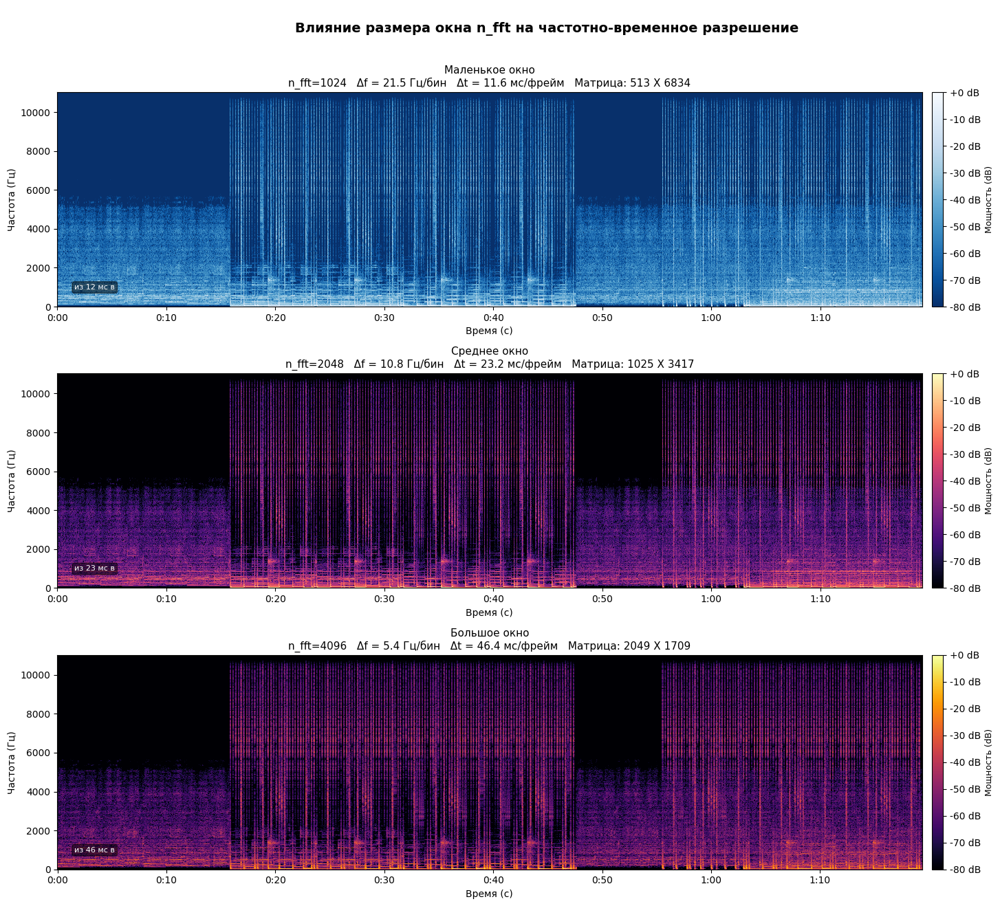

In [16]:
CONFIGS = [
    {"n_fft": 1024, "hop_length": 256,  "label": "Маленькое окно\nn_fft=1024",  "color": "Blues_r"},
    {"n_fft": 2048, "hop_length": 512,  "label": "Среднее окно\nn_fft=2048",   "color": "magma"},
    {"n_fft": 4096, "hop_length": 1024, "label": "Большое окно\nn_fft=4096",   "color": "inferno"},
]

stft_results = []
print("\nВычисление STFT матриц:")
for cfg in CONFIGS:
    # librosa.stft возвращает комплексную матрицу
    D_complex = librosa.stft(
        y_normalized,
        n_fft=cfg["n_fft"],
        hop_length=cfg["hop_length"],
        window='hann', # окно Ханна
        center=True    # дополняет сигнал нулями по краям
    )
    
    # амплитудный спектр
    D_magnitude = np.abs(D_complex)
    
    # перевод в децибелы
    # ref=np.max — нормируем относительно максимума
    D_db = librosa.amplitude_to_db(D_magnitude, ref=np.max)
    
    stft_results.append({
        **cfg,
        "D_complex":   D_complex,
        "D_magnitude": D_magnitude,
        "D_db":        D_db,
        "n_frames":    D_complex.shape[1],
        "n_freqs":     D_complex.shape[0],
    })
    
    print(f"  n_fft={cfg['n_fft']:5d}: матрица D = "
          f"{D_complex.shape[0]} частот Х {D_complex.shape[1]} фреймов, "
          f"диапазон dB: [{D_db.min():.1f}, {D_db.max():.1f}]")

fig, axes = plt.subplots(3, 1, figsize=(16, 13))
fig.suptitle('\nВлияние размера окна n_fft на частотно-временное разрешение',
             fontsize=14, fontweight='bold', y=1.01)

for ax, res in zip(axes, stft_results):
    img = librosa.display.specshow(
        res["D_db"], sr=TARGET_SR, hop_length=res["hop_length"],
        x_axis='time', y_axis='hz', cmap=res["color"], ax=ax
    )
    cbar = fig.colorbar(img, ax=ax, format="%+2.0f dB", pad=0.01)
    cbar.set_label('Мощность (dB)', fontsize=9)
    
    delta_f = TARGET_SR / res["n_fft"]
    delta_t = res["hop_length"] / TARGET_SR * 1000
    
    ax.set_title(f"{res['label']}   Δf = {delta_f:.1f} Гц/бин   Δt = {delta_t:.1f} мс/фрейм   Матрица: {res['n_freqs']} Х {res['n_frames']}",
                 fontsize=11, pad=6)
    ax.set_xlabel('Время (с)', fontsize=10)
    ax.set_ylabel('Частота (Гц)', fontsize=10)
    ax.set_ylim(0, TARGET_SR // 2)
    
    # Аннотация: стрелки «разрешение»
    ax.annotate(f'из {delta_t:.0f} мс в',
                xy=(0.02, 0.08), xycoords='axes fraction',
                fontsize=8, color='white',
                bbox=dict(boxstyle='round,pad=0.3', facecolor='black', alpha=0.5))

plt.tight_layout()
plt.savefig('block2_spectrograms.png', dpi=150, bbox_inches='tight')
plt.show()

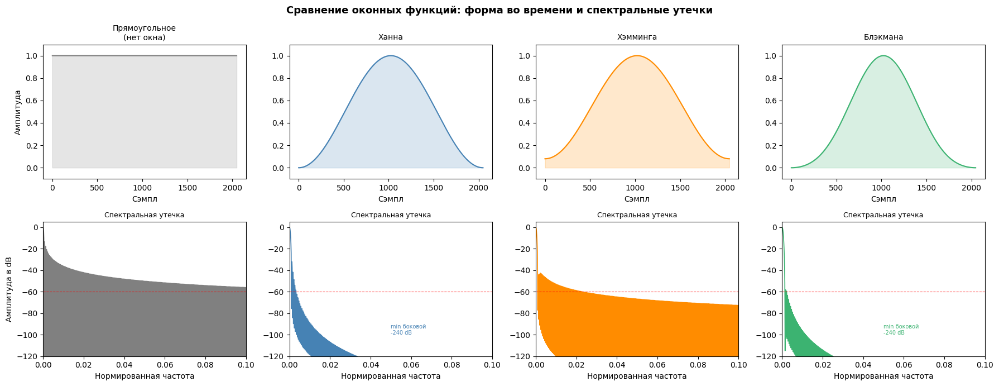

'окно Ханна — отличный баланс для аудиофингерпринтинга\nОно подавляет утечку до приблизительно 60 dB при минимальных потерях в главном лепестке'

In [17]:
N = 2048  # размер окна для иллюстрации
window_types = {
    'Прямоугольное\n(нет окна)': np.ones(N),
    'Ханна':              scipy_windows.hann(N),
    'Хэмминга':        scipy_windows.hamming(N),
    'Блэкмана':       scipy_windows.blackman(N),
}

fig, axes = plt.subplots(2, 4, figsize=(18, 7))
fig.suptitle('Сравнение оконных функций: форма во времени и спектральные утечки', fontsize=13, fontweight='bold')
colors = ['gray', 'steelblue', 'darkorange', 'mediumseagreen']

for idx, (name, w) in enumerate(window_types.items()):
    # Верхний ряд — форма окна во времени
    ax_time = axes[0, idx]
    ax_time.plot(w, color=colors[idx], linewidth=1.5)
    ax_time.set_title(name, fontsize=10)
    ax_time.set_xlabel('Сэмпл')
    ax_time.set_ylim(-0.1, 1.1)
    if idx == 0: ax_time.set_ylabel('Амплитуда')
    ax_time.fill_between(range(N), w, alpha=0.2, color=colors[idx])
    
    # Нижний ряд — логарифмический спектр окна (утечка)
    ax_freq = axes[1, idx]
    W = np.fft.rfft(w, n=8192)
    W_db = 20 * np.log10(np.abs(W) / np.max(np.abs(W)) + 1e-12)
    freqs = np.linspace(0, 0.5, len(W_db))
    
    ax_freq.plot(freqs, W_db, color=colors[idx], linewidth=1.2)
    ax_freq.set_ylim(-120, 5)
    ax_freq.set_xlim(0, 0.1)
    ax_freq.axhline(-60, color='red', linewidth=0.8, linestyle='--', alpha=0.7)
    ax_freq.set_xlabel('Нормированная частота')
    if idx == 0: ax_freq.set_ylabel('Амплитуда в dB')
    ax_freq.set_title('Спектральная утечка', fontsize=9)
    
    # Поиск бокового лепестка
    sidelobe_db = W_db[W_db < -3].min() if len(W_db[W_db < -3]) > 0 else -120
    ax_freq.text(0.05, -100, f'min боковой\n{sidelobe_db:.0f} dB', fontsize=7, color=colors[idx])

plt.tight_layout()
plt.savefig('block2_windows.png', dpi=150, bbox_inches='tight')
plt.show()

"""окно Ханна — отличный баланс для аудиофингерпринтинга
Оно подавляет утечку до приблизительно 60 dB при минимальных потерях в главном лепестке"""

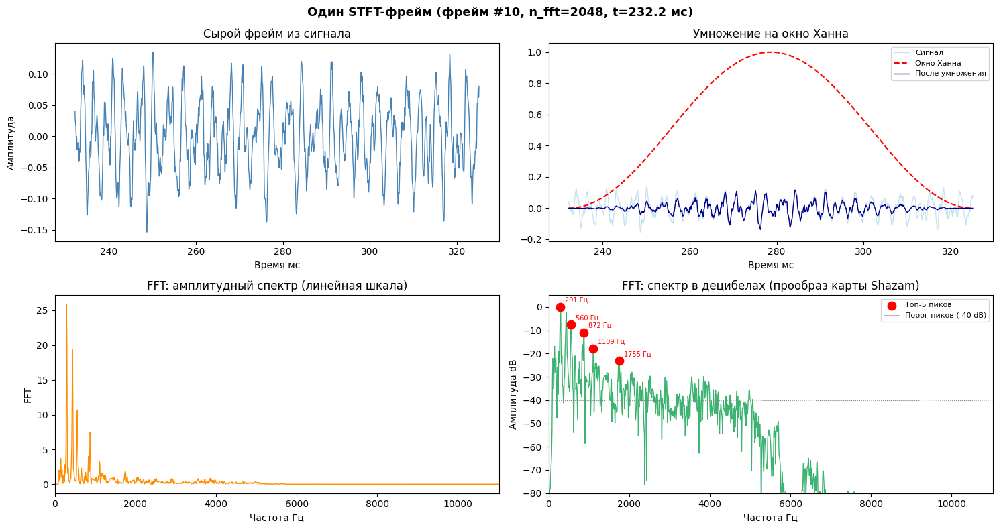

In [18]:
N_FFT_FRAME = 2048
HOP_FRAME   = 512
FRAME_IDX   = 10  # номер фрейма для анализа

# извлекаем фрейм 
frame_start  = FRAME_IDX * HOP_FRAME
frame_end    = frame_start + N_FFT_FRAME
raw_frame    = y_normalized[frame_start:frame_end]

# применяем окно Ханна
hann_window    = np.hanning(N_FFT_FRAME)
windowed_frame = raw_frame * hann_window

# FFT фрейма
fft_result  = np.fft.rfft(windowed_frame)
fft_mag     = np.abs(fft_result)
fft_db      = 20 * np.log10(fft_mag / (np.max(fft_mag) + 1e-12))
freqs_hz    = np.linspace(0, TARGET_SR / 2, len(fft_mag))

fig, axes = plt.subplots(2, 2, figsize=(15, 8))
fig.suptitle(f'Один STFT-фрейм (фрейм #{FRAME_IDX}, n_fft={N_FFT_FRAME}, t={frame_start/TARGET_SR*1000:.1f} мс)',
             fontsize=13, fontweight='bold')
t_frame = np.linspace(frame_start, frame_end, N_FFT_FRAME) / TARGET_SR * 1000

# сырой фрейм
axes[0, 0].plot(t_frame, raw_frame, color='steelblue', linewidth=1)
axes[0, 0].set_title('Сырой фрейм из сигнала')
axes[0, 0].set_xlabel('Время мс')
axes[0, 0].set_ylabel('Амплитуда')

# окно Ханна
axes[0, 1].plot(t_frame, raw_frame, color='lightblue', linewidth=1, alpha=0.7, label='Сигнал')
axes[0, 1].plot(t_frame, hann_window, color='red', linewidth=1.5, linestyle='--', label='Окно Ханна')
axes[0, 1].plot(t_frame, windowed_frame, color='darkblue', linewidth=1, label='После умножения')
axes[0, 1].set_title('Умножение на окно Ханна')
axes[0, 1].set_xlabel('Время мс')
axes[0, 1].legend(fontsize=8)

# спектр (линейный)
axes[1, 0].plot(freqs_hz, fft_mag, color='darkorange', linewidth=1)
axes[1, 0].set_title('FFT: амплитудный спектр (линейная шкала)')
axes[1, 0].set_xlabel('Частота Гц')
axes[1, 0].set_ylabel('FFT')
axes[1, 0].set_xlim(0, TARGET_SR // 2)

# спектр логарифмический dB
axes[1, 1].plot(freqs_hz, fft_db, color='mediumseagreen', linewidth=1)
axes[1, 1].set_title('FFT: спектр в децибелах (прообраз карты Shazam)')
axes[1, 1].set_xlabel('Частота Гц')
axes[1, 1].set_ylabel('Амплитуда dB')
axes[1, 1].set_xlim(0, TARGET_SR // 2)
axes[1, 1].set_ylim(-80, 5)

# отметим топ 5 пиков по методу из Wang03
peaks, props = find_peaks(fft_db, height=-40, distance=20)
top_peaks = peaks[np.argsort(fft_db[peaks])[-5:]]

axes[1, 1].scatter(freqs_hz[top_peaks], fft_db[top_peaks], color='red', s=80, zorder=5, label='Топ-5 пиков')
for p in top_peaks:
    axes[1, 1].annotate(f'{freqs_hz[p]:.0f} Гц', xy=(freqs_hz[p], fft_db[p]),
                        xytext=(5, 5), textcoords='offset points', fontsize=7, color='red')
axes[1, 1].axhline(-40, color='gray', linewidth=0.8, linestyle=':', label='Порог пиков (-40 dB)')
axes[1, 1].legend(fontsize=8)

plt.tight_layout()
plt.savefig('block2_frame_anatomy.png', dpi=150, bbox_inches='tight')
plt.show()

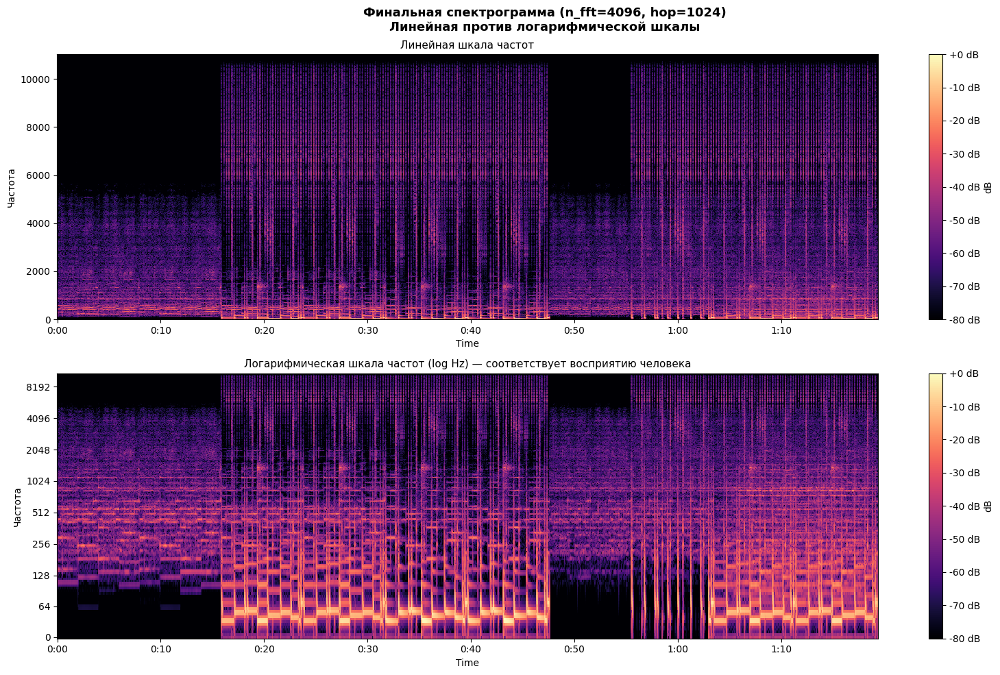

In [19]:
N_FFT_FINAL = 4096
HOP_FINAL   = 1024

D_final = librosa.stft(y_normalized, n_fft=N_FFT_FINAL, hop_length=HOP_FINAL, window='hann')
D_db_final = librosa.amplitude_to_db(np.abs(D_final), ref=np.max)

fig, axes = plt.subplots(2, 1, figsize=(16, 10))
fig.suptitle(f'Финальная спектрограмма (n_fft={N_FFT_FINAL}, hop={HOP_FINAL})\nЛинейная против логарифмической шкалы',
             fontsize=13, fontweight='bold')

# Линейная шкала частот
img1 = librosa.display.specshow(D_db_final, sr=TARGET_SR, hop_length=HOP_FINAL, x_axis='time', y_axis='hz', cmap='magma', ax=axes[0])
fig.colorbar(img1, ax=axes[0], format='%+2.0f dB').set_label('dB')
axes[0].set_title('Линейная шкала частот', fontsize=11)
axes[0].set_ylabel('Частота')

# Логарифмическая шкала частот (log Hz)
img2 = librosa.display.specshow(D_db_final, sr=TARGET_SR, hop_length=HOP_FINAL, x_axis='time', y_axis='log', cmap='magma', ax=axes[1])
fig.colorbar(img2, ax=axes[1], format='%+2.0f dB').set_label('dB')
axes[1].set_title('Логарифмическая шкала частот (log Hz) — соответствует восприятию человека', fontsize=11)
axes[1].set_ylabel('Частота')

plt.tight_layout()
plt.savefig('block2_final_spectrogram.png', dpi=150, bbox_inches='tight')
plt.show()

In [20]:
delta_f = TARGET_SR / N_FFT_FINAL
delta_t = HOP_FINAL / TARGET_SR * 1000

print("ИТОГ:")
print(f"n_fft = {N_FFT_FINAL} Δf = {delta_f:.1f} Гц/би")
print(f"hop_length = {HOP_FINAL} Δt = {delta_t:.1f} мс/фрейм")
print("window = Hann Подавление спектральной утечки до -60 dB")
print("y_axis = log")
print(f"{1/(4*np.pi):.4f}): {delta_t/1000:.4f} с * {delta_f:.1f} Гц = {delta_t/1000*delta_f:.4f}")

ИТОГ:
n_fft = 4096 Δf = 5.4 Гц/би
hop_length = 1024 Δt = 46.4 мс/фрейм
window = Hann Подавление спектральной утечки до -60 dB
y_axis = log
0.0796): 0.0464 с * 5.4 Гц = 0.2500


**Блок 3. Классический поиск признаков: Constellation Map**

In [21]:
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy.ndimage import maximum_filter
import warnings

warnings.filterwarnings('ignore')

print("Параметры из предыдущих блоков:")
print(f"  sr         = {TARGET_SR} Гц")
print(f"  n_fft      = {N_FFT_FINAL}")
print(f"  hop_length = {HOP_FINAL}")

Параметры из предыдущих блоков:
  sr         = 22050 Гц
  n_fft      = 4096
  hop_length = 1024


In [22]:
D_complex = librosa.stft(y_normalized, n_fft=N_FFT_FINAL, hop_length=HOP_FINAL, window='hann')
D_magnitude = np.abs(D_complex)
D_db = librosa.amplitude_to_db(D_magnitude, ref=np.max)

print(f"Форма матрицы спектрограммы: {D_db.shape}")
print(f"  Частотных бинов:   {D_db.shape[0]}")
print(f"  Временных фреймов: {D_db.shape[1]}")
print(f"  Диапазон значений: [{D_db.min():.1f}, {D_db.max():.1f}] dB\n") # готовим матрицу

Форма матрицы спектрограммы: (2049, 1709)
  Частотных бинов:   2049
  Временных фреймов: 1709
  Диапазон значений: [-80.0, 0.0] dB



In [23]:
def find_peaks_2d(
    spectrogram_db: np.ndarray,
    neighborhood_freq: int = 20,   # окрестность по частоте
    neighborhood_time: int = 20,   # окрестность по времени
    threshold_db: float = -40.0,   # минимальный уровень в dB
    min_freq_bin: int = 10,        # игнорируем частоты ниже плюс минус 50 Гц 
    max_freq_bin: int = None,      # верхняя граница по частоте
) -> tuple[np.ndarray, np.ndarray]:
    """
    Находит локальные максимумы в 2D-спектрограмме.
    """
    if max_freq_bin is None:
        max_freq_bin = spectrogram_db.shape[0]
        
    # применяем 2D maximum filter
    struct = np.ones((neighborhood_freq, neighborhood_time), dtype=bool)
    local_max = maximum_filter(spectrogram_db, footprint=struct)
    
    # истинный локальный максимум
    peaks_mask = (spectrogram_db == local_max)
    
    # порог амплитуды (удаляем фоновый шум)
    amplitude_mask = (spectrogram_db > threshold_db)
    
    # ограничиваем частотный диапазон (защита от низкочастотного гула микрофона)
    freq_range_mask = np.zeros_like(spectrogram_db, dtype=bool)
    freq_range_mask[min_freq_bin:max_freq_bin, :] = True
    
    # Итоговая маска
    final_mask = peaks_mask & amplitude_mask & freq_range_mask
    
    freq_idx, time_idx = np.where(final_mask)
    return freq_idx, time_idx

In [24]:
total_bins = D_db.shape[0] * D_db.shape[1]
print("как параметры влияют на количество пиков")
print(f"  {'neighborhood':^15}  {'threshold dB':^12}  {'пиков':^8}  {'пиков/сек':^10}  {'сжатие':^8}")

neighborhoods = [5, 10, 20, 40]
thresholds    = [-80, -60, -40]

for nbh in neighborhoods:
    for thr in thresholds:
        fi, ti = find_peaks_2d(D_db, nbh, nbh, thr)
        density = len(fi) / (len(y_normalized) / TARGET_SR)
        compression = total_bins / (len(fi) + 1)
        print(f"  {nbh:^15d}  {thr:^12.0f}  {len(fi):^8d}  {density:^10.1f}  {compression:^8.0f}")

print("\n оптимальная плотность для устойчивого хеширования ≈ 30–50 пиков/сек")
print(" neighborhood=20, threshold=-40 dB (или корректируем под трек)")

как параметры влияют на количество пиков
   neighborhood    threshold dB   пиков    пиков/сек    сжатие 
         5             -80        62592      788.9        56   
         5             -60        51063      643.6        69   
         5             -40         6915       87.2       506   
        10             -80        20771      261.8       169   
        10             -60        19175      241.7       183   
        10             -40         4324       54.5       810   
        20             -80         5558       70.1       630   
        20             -60         5325       67.1       657   
        20             -40         1977       24.9       1770  
        40             -80         1610       20.3       2174  
        40             -60         1590       20.0       2201  
        40             -40         938        11.8       3729  

 оптимальная плотность для устойчивого хеширования ≈ 30–50 пиков/сек
 neighborhood=20, threshold=-40 dB (или корректируем под 

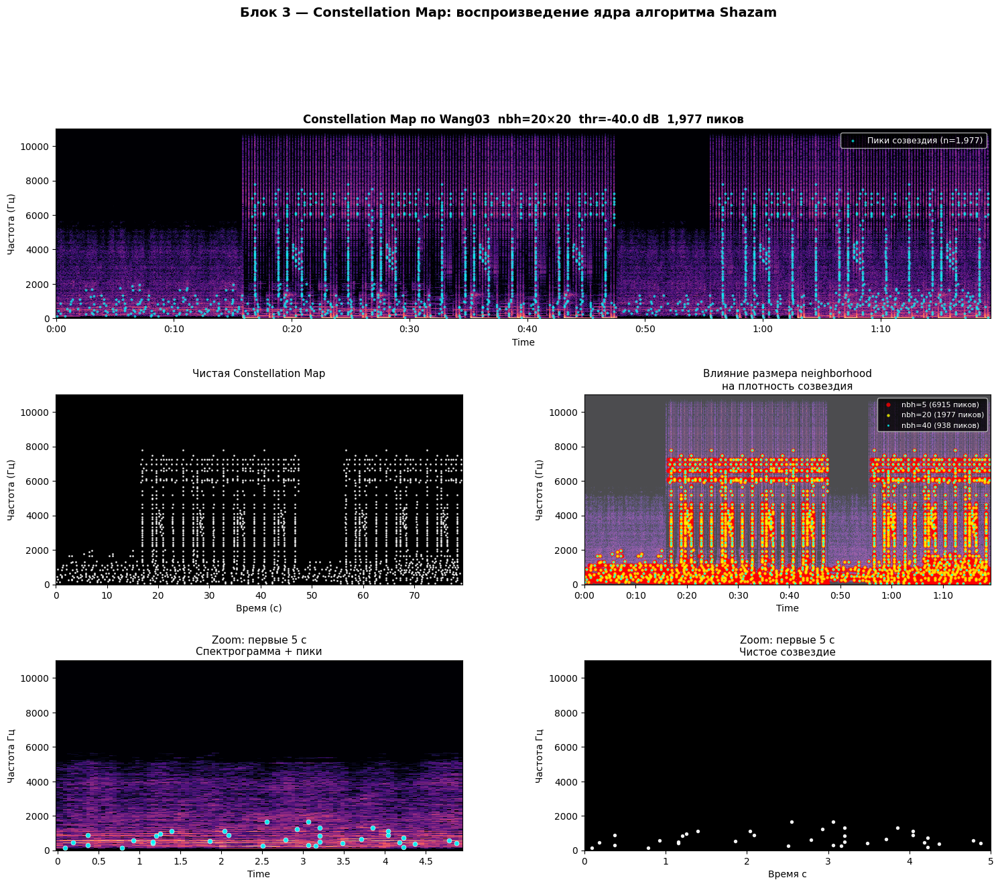

In [25]:
NEIGHBORHOOD = 20
THRESHOLD_DB = -40.0

freq_idx_final, time_idx_final = find_peaks_2d(
    D_db, neighborhood_freq=NEIGHBORHOOD, neighborhood_time=NEIGHBORHOOD, threshold_db=THRESHOLD_DB
)

freqs_final = librosa.fft_frequencies(sr=TARGET_SR, n_fft=N_FFT_FINAL)[freq_idx_final]
times_final = librosa.frames_to_time(time_idx_final, sr=TARGET_SR, hop_length=HOP_FINAL)

fig = plt.figure(figsize=(18, 14))
gs  = gridspec.GridSpec(3, 2, figure=fig, hspace=0.4, wspace=0.3)

# График 1: Спектрограмма и пики
ax_main = fig.add_subplot(gs[0, :])
librosa.display.specshow(D_db, sr=TARGET_SR, hop_length=HOP_FINAL, x_axis='time', y_axis='hz', cmap='magma', ax=ax_main)
ax_main.scatter(times_final, freqs_final, c='cyan', s=8, alpha=0.7, linewidths=0, label=f'Пики созвездия (n={len(freq_idx_final):,})', zorder=5)
ax_main.set_title(f'Constellation Map по Wang03  nbh={NEIGHBORHOOD}×{NEIGHBORHOOD}  thr={THRESHOLD_DB} dB  {len(freq_idx_final):,} пиков', fontsize=12, fontweight='bold')
ax_main.set_ylabel('Частота (Гц)')
ax_main.legend(loc='upper right', fontsize=9, facecolor='black', labelcolor='white')
ax_main.set_ylim(0, TARGET_SR // 2)

# График 2: Только карта
ax_const = fig.add_subplot(gs[1, 0])
ax_const.set_facecolor('black')
ax_const.scatter(times_final, freqs_final, c='white', s=4, alpha=0.9, linewidths=0)
ax_const.set_title('Чистая Constellation Map\n', fontsize=11)
ax_const.set_xlabel('Время (с)')
ax_const.set_ylabel('Частота (Гц)')
ax_const.set_xlim(0, len(y_normalized) / TARGET_SR)
ax_const.set_ylim(0, TARGET_SR // 2)

# График 3: Сравнение neighborhood
ax_cmp = fig.add_subplot(gs[1, 1])
librosa.display.specshow(D_db, sr=TARGET_SR, hop_length=HOP_FINAL, x_axis='time', y_axis='hz', cmap='magma', ax=ax_cmp, alpha=0.7)
colors_nbh = ['red', 'yellow', 'cyan']
sizes_nbh  = [20, 10, 5]
nbhs_to_show = [5, 20, 40]

for nbh, col, sz in zip(nbhs_to_show, colors_nbh, sizes_nbh):
    fi, ti = find_peaks_2d(D_db, nbh, nbh, THRESHOLD_DB)
    fr = librosa.fft_frequencies(sr=TARGET_SR, n_fft=N_FFT_FINAL)[fi]
    tm = librosa.frames_to_time(ti, sr=TARGET_SR, hop_length=HOP_FINAL)
    ax_cmp.scatter(tm, fr, c=col, s=sz, alpha=0.8, linewidths=0, label=f'nbh={nbh} ({len(fi)} пиков)')

ax_cmp.set_title('Влияние размера neighborhood\nна плотность созвездия', fontsize=11)
ax_cmp.legend(loc='upper right', fontsize=8, facecolor='black', labelcolor='white')
ax_cmp.set_ylabel('Частота (Гц)')
ax_cmp.set_ylim(0, TARGET_SR // 2)

# Графики 4 и 5: Zoom
ZOOM_SEC = 5.0
zoom_mask = times_final <= ZOOM_SEC
ax_zoom1 = fig.add_subplot(gs[2, 0])
zoom_frames = int(ZOOM_SEC * TARGET_SR / HOP_FINAL)
D_db_zoom = D_db[:, :zoom_frames]

librosa.display.specshow(D_db_zoom, sr=TARGET_SR, hop_length=HOP_FINAL, x_axis='time', y_axis='hz', cmap='magma', ax=ax_zoom1)
ax_zoom1.scatter(times_final[zoom_mask], freqs_final[zoom_mask], c='cyan', s=25, alpha=0.9, linewidths=0.5, edgecolors='white', zorder=5)
ax_zoom1.set_title(f'Zoom: первые {ZOOM_SEC:.0f} с\nСпектрограмма + пики', fontsize=11)
ax_zoom1.set_ylabel('Частота Гц')
ax_zoom1.set_ylim(0, TARGET_SR // 2)

ax_zoom2 = fig.add_subplot(gs[2, 1])
ax_zoom2.set_facecolor('black')
ax_zoom2.scatter(times_final[zoom_mask], freqs_final[zoom_mask], c='white', s=15, alpha=0.95, linewidths=0)
ax_zoom2.set_title(f'Zoom: первые {ZOOM_SEC:.0f} с\nЧистое созвездие', fontsize=11)
ax_zoom2.set_xlabel('Время с')
ax_zoom2.set_ylabel('Частота Гц')
ax_zoom2.set_xlim(0, ZOOM_SEC)
ax_zoom2.set_ylim(0, TARGET_SR // 2)

fig.suptitle('Блок 3 — Constellation Map: воспроизведение ядра алгоритма Shazam', fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('block3_constellation_map.png', dpi=150, bbox_inches='tight')
plt.show()

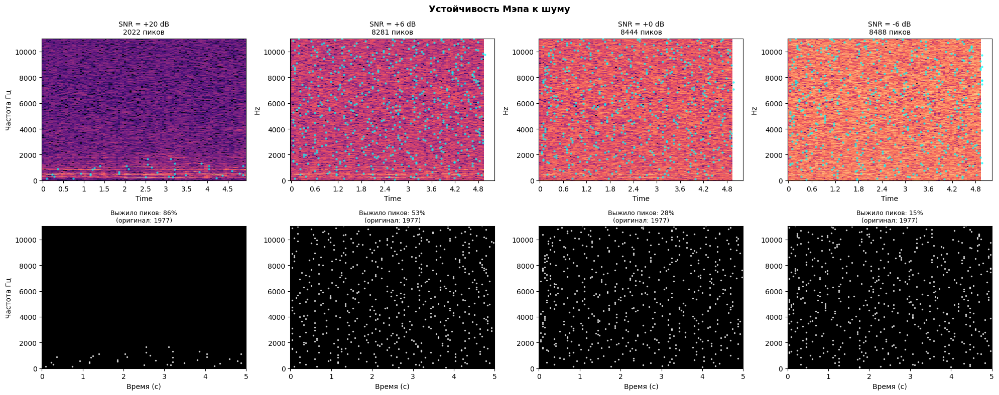

In [26]:
# тест на устойчивость к шуму
def add_noise(signal, snr_db):
    """Добавляет белый шум с заданным SNR дБ"""
    signal_power = np.mean(signal ** 2)
    noise_power  = signal_power / (10 ** (snr_db / 10))
    noise        = np.random.normal(0, np.sqrt(noise_power), len(signal))
    return signal + noise

SNR_LEVELS = [20, 6, 0, -6]
fig, axes = plt.subplots(2, len(SNR_LEVELS), figsize=(20, 8))
fig.suptitle('Устойчивость Мэпа к шуму', fontsize=13, fontweight='bold')

original_coords = set(zip(freq_idx_final.tolist(), time_idx_final.tolist()))

for col_idx, snr in enumerate(SNR_LEVELS):
    noisy_signal = add_noise(y_normalized, snr)
    noisy_signal = noisy_signal / (np.max(np.abs(noisy_signal)) + 1e-12)
    
    D_noisy = librosa.stft(noisy_signal, n_fft=N_FFT_FINAL, hop_length=HOP_FINAL)
    D_noisy_db = librosa.amplitude_to_db(np.abs(D_noisy), ref=np.max)
    
    fi_noisy, ti_noisy = find_peaks_2d(D_noisy_db, NEIGHBORHOOD, NEIGHBORHOOD, THRESHOLD_DB)
    fr_noisy = librosa.fft_frequencies(sr=TARGET_SR, n_fft=N_FFT_FINAL)[fi_noisy]
    tm_noisy = librosa.frames_to_time(ti_noisy, sr=TARGET_SR, hop_length=HOP_FINAL)
    
    noisy_coords = set(zip(fi_noisy.tolist(), ti_noisy.tolist()))
    
    # Допуск плюс минус 1 бин по обеим осям для компенсации микросдвигов Фурье
    survived = sum(
        1 for (f, t) in original_coords
        if any((f + df, t + dt) in noisy_coords for df in range(-1, 2) for dt in range(-1, 2))
    )
    survival_rate = survived / len(original_coords) * 100

    ax_top = axes[0, col_idx]
    librosa.display.specshow(D_noisy_db[:, :zoom_frames], sr=TARGET_SR, hop_length=HOP_FINAL, x_axis='time', y_axis='hz', cmap='magma', ax=ax_top)
    zoom_mask_n = tm_noisy <= ZOOM_SEC
    ax_top.scatter(tm_noisy[zoom_mask_n], fr_noisy[zoom_mask_n], c='cyan', s=10, alpha=0.7, linewidths=0, zorder=5)
    ax_top.set_title(f'SNR = {snr:+d} dB\n{len(fi_noisy)} пиков', fontsize=10)
    ax_top.set_ylim(0, TARGET_SR // 2)
    if col_idx == 0: ax_top.set_ylabel('Частота Гц')

    ax_bot = axes[1, col_idx]
    ax_bot.set_facecolor('black')
    ax_bot.scatter(tm_noisy[zoom_mask_n], fr_noisy[zoom_mask_n], c='white', s=6, alpha=0.8, linewidths=0)
    ax_bot.set_title(f'Выжило пиков: {survival_rate:.0f}%\n(оригинал: {len(original_coords)})', fontsize=9, color='black')
    ax_bot.set_xlim(0, ZOOM_SEC)
    ax_bot.set_ylim(0, TARGET_SR // 2)
    ax_bot.set_xlabel('Время (с)')
    if col_idx == 0: ax_bot.set_ylabel('Частота Гц')

plt.tight_layout()
plt.savefig('block3_noise_robustness.png', dpi=150, bbox_inches='tight')
plt.show()

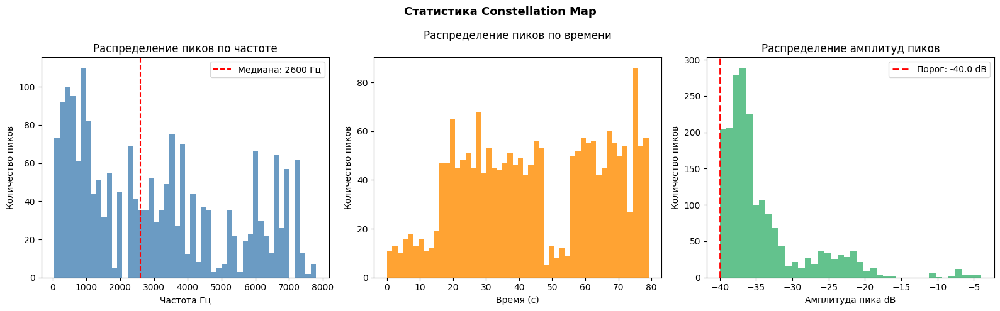

In [27]:
# статистика пиков
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
fig.suptitle('Статистика Constellation Map', fontsize=13, fontweight='bold')

axes[0].hist(freqs_final, bins=50, color='steelblue', edgecolor='none', alpha=0.8)
axes[0].set_xlabel('Частота Гц')
axes[0].set_ylabel('Количество пиков')
axes[0].set_title('Распределение пиков по частоте')
axes[0].axvline(np.median(freqs_final), color='red', linestyle='--', label=f'Медиана: {np.median(freqs_final):.0f} Гц')
axes[0].legend()

axes[1].hist(times_final, bins=50, color='darkorange', edgecolor='none', alpha=0.8)
axes[1].set_xlabel('Время (с)')
axes[1].set_ylabel('Количество пиков')
axes[1].set_title('Распределение пиков по времени\n')

peak_powers = D_db[freq_idx_final, time_idx_final]
axes[2].hist(peak_powers, bins=40, color='mediumseagreen', edgecolor='none', alpha=0.8)
axes[2].axvline(THRESHOLD_DB, color='red', linewidth=2, linestyle='--', label=f'Порог: {THRESHOLD_DB} dB')
axes[2].set_xlabel('Амплитуда пика dB')
axes[2].set_ylabel('Количество пиков')
axes[2].set_title('Распределение амплитуд пиков')
axes[2].legend()

plt.tight_layout()
plt.savefig('block3_peak_statistics.png', dpi=150, bbox_inches='tight')
plt.show()

In [28]:
def get_constellation_map(
    audio: np.ndarray,
    sr: int,
    n_fft: int = 4096,
    hop_length: int = 1024,
    neighborhood: int = 20,
    threshold_db: float = -40.0
) -> tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    аудиосигнал в Constellation Map.
    Возвращает: times в сек, freqs в герцах, D_db спектрограмма
    """
    D = librosa.stft(audio, n_fft=n_fft, hop_length=hop_length, window='hann')
    D_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
    
    struct = np.ones((neighborhood, neighborhood), dtype=bool)
    local_max = maximum_filter(D_db, footprint=struct)
    mask = (D_db == local_max) & (D_db > threshold_db)
    
    # Срез инфразвука
    min_bin = 10
    freq_range_mask = np.zeros_like(D_db, dtype=bool)
    freq_range_mask[min_bin:, :] = True
    mask = mask & freq_range_mask
    
    freq_idx, time_idx = np.where(mask)
    times = librosa.frames_to_time(time_idx, sr=sr, hop_length=hop_length)
    freqs = librosa.fft_frequencies(sr=sr, n_fft=n_fft)[freq_idx]
    
    return times, freqs, D_db

times_map, freqs_map, D_db_test = get_constellation_map(
    y_normalized, TARGET_SR, n_fft=N_FFT_FINAL, hop_length=HOP_FINAL,
    neighborhood=NEIGHBORHOOD, threshold_db=THRESHOLD_DB
)

print("\nИТОГ")
print(f"Параметры: neighborhood={NEIGHBORHOOD}x{NEIGHBORHOOD}, threshold={THRESHOLD_DB} dB")
print(f"Плотность: {len(times_map)/(len(y_normalized)/TARGET_SR):.1f} пиков/сек")


ИТОГ
Параметры: neighborhood=20x20, threshold=-40.0 dB
Плотность: 24.9 пиков/сек


**БЛОК 4. Мел-спектрограммы: психоакустика для нейросети**

In [29]:
# вот что имеем
print(f"sr = {TARGET_SR} Гц")
print(f"n_fft = {N_FFT_FINAL}")
print(f"hop_length = {HOP_FINAL}")
print(f"STFT матрица D_db: {D_db.shape} (частот Х фреймов)")

sr = 22050 Гц
n_fft = 4096
hop_length = 1024
STFT матрица D_db: (2049, 1709) (частот Х фреймов)


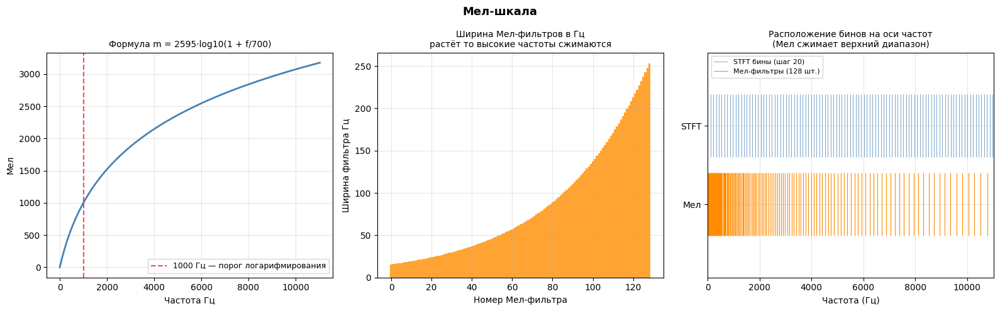

In [30]:
hz_range = np.linspace(0, TARGET_SR // 2, 10000)
# Формула перевода герц в мелы
mel_range = 2595 * np.log10(1 + hz_range / 700)

fig, axes = plt.subplots(1, 3, figsize=(16, 5))
fig.suptitle('Мел-шкала', fontsize=13, fontweight='bold')

# формула
axes[0].plot(hz_range, mel_range, color='steelblue', linewidth=2)
axes[0].axvline(1000, color='red', linestyle='--', alpha=0.7, label='1000 Гц — порог логарифмирования')
axes[0].set_xlabel('Частота Гц')
axes[0].set_ylabel('Мел')
axes[0].set_title('Формула m = 2595·log10(1 + f/700)', fontsize=10)
axes[0].legend(fontsize=9)
axes[0].grid(alpha=0.3)

# ширина фильтров
N_MEL_BINS = 128
mel_points = np.linspace(0, mel_range.max(), N_MEL_BINS + 2)
hz_from_mel = 700 * (10 ** (mel_points / 2595) - 1)
bin_widths = np.diff(hz_from_mel)

axes[1].bar(range(len(bin_widths)), bin_widths, color='darkorange', alpha=0.8, width=1.0)
axes[1].set_xlabel('Номер Мел-фильтра')
axes[1].set_ylabel('Ширина фильтра Гц')
axes[1].set_title('Ширина Мел-фильтров в Гц\nрастёт то высокие частоты сжимаются', fontsize=10)
axes[1].grid(alpha=0.3)

# покрытие частот
linear_bins = np.linspace(0, TARGET_SR // 2, N_FFT_FINAL // 2 + 1)
axes[2].eventplot([linear_bins[::20]], lineoffsets=1.5, linelengths=0.8, colors='steelblue', linewidths=0.5, label=f'STFT бины (шаг 20)')
axes[2].eventplot([hz_from_mel[1:-1]], lineoffsets=0.5, linelengths=0.8, colors='darkorange', linewidths=0.8, label=f'Мел-фильтры ({N_MEL_BINS} шт.)')
axes[2].set_xlabel('Частота (Гц)')
axes[2].set_title('Расположение бинов на оси частот\n(Мел сжимает верхний диапазон)', fontsize=10)
axes[2].set_yticks([0.5, 1.5], ['Мел', 'STFT'])
axes[2].legend(fontsize=8, loc='upper left')
axes[2].set_xlim(0, TARGET_SR // 2)
axes[2].grid(alpha=0.3)

plt.tight_layout()
plt.savefig('block4_melscale.png', dpi=150, bbox_inches='tight')
plt.show()

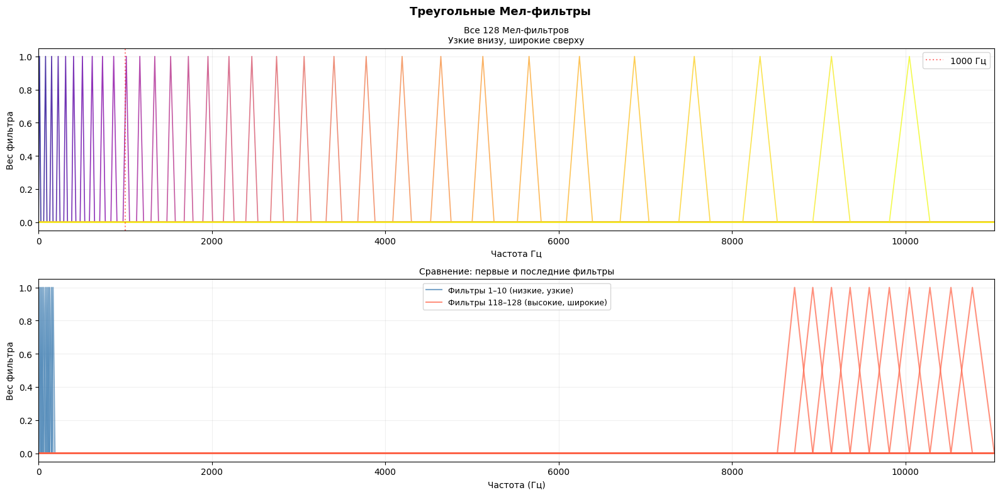

In [31]:
# считаем вручную и визуализируем мел
N_MEL_SHOW = 128
N_FFT_FBANK = N_FFT_FINAL
SR_FBANK = TARGET_SR

bin_points = np.floor((N_FFT_FBANK + 1) * hz_from_mel / SR_FBANK).astype(int)
fbank_manual = np.zeros((N_MEL_SHOW, N_FFT_FBANK // 2 + 1))

for m in range(1, N_MEL_SHOW + 1):
    f_left   = bin_points[m - 1]
    f_center = bin_points[m]
    f_right  = bin_points[m + 1]
    
    # защита от деления на ноль
    denom_left  = max(1, f_center - f_left)
    denom_right = max(1, f_right - f_center)
    
    for k in range(f_left, f_center):
        fbank_manual[m-1, k] = (k - f_left) / denom_left
    for k in range(f_center, f_right):
        fbank_manual[m-1, k] = (f_right - k) / denom_right

freqs_axis = np.linspace(0, SR_FBANK // 2, N_FFT_FBANK // 2 + 1)

fig, axes = plt.subplots(2, 1, figsize=(16, 8))
fig.suptitle('Треугольные Мел-фильтры', fontsize=13, fontweight='bold')

# все фильтры
ax1 = axes[0]
colors_fbank = plt.cm.plasma(np.linspace(0, 1, N_MEL_SHOW // 4))
for i, (filt, col) in enumerate(zip(fbank_manual[::4], colors_fbank)):
    ax1.plot(freqs_axis, filt, color=col, linewidth=1.2, alpha=0.8)
ax1.set_xlabel('Частота Гц')
ax1.set_ylabel('Вес фильтра')
ax1.set_title(f'Все {N_MEL_SHOW} Мел-фильтров\nУзкие внизу, широкие сверху', fontsize=10)
ax1.set_xlim(0, SR_FBANK // 2)
ax1.axvline(1000, color='red', linestyle=':', alpha=0.5, label='1000 Гц')
ax1.legend()
ax1.grid(alpha=0.2)

# первые 10 и последние 10
ax2 = axes[1]
for i in range(10):
    ax2.plot(freqs_axis, fbank_manual[i], color='steelblue', linewidth=1.5, alpha=0.7, label='Фильтры 1–10 (низкие, узкие)' if i == 0 else '')
for i in range(N_MEL_SHOW - 10, N_MEL_SHOW):
    ax2.plot(freqs_axis, fbank_manual[i], color='tomato', linewidth=1.5, alpha=0.7, label=f'Фильтры {N_MEL_SHOW-10}–{N_MEL_SHOW} (высокие, широкие)' if i == N_MEL_SHOW - 10 else '')
ax2.set_xlabel('Частота (Гц)')
ax2.set_ylabel('Вес фильтра')
ax2.set_title('Сравнение: первые и последние фильтры', fontsize=10)
ax2.legend(fontsize=9)
ax2.set_xlim(0, SR_FBANK // 2)
ax2.grid(alpha=0.2)

plt.tight_layout()
plt.savefig('block4_mel_filter.png', dpi=150, bbox_inches='tight')
plt.show()

In [32]:
# мел спектограмма
MEL_CONFIGS = [
    {"n_mels": 64,  "label": "n_mels=64\n(лёгкая модель)"},
    {"n_mels": 128, "label": "n_mels=128\n(стандарт модели OpenL3)"},
    {"n_mels": 256, "label": "n_mels=256\n(максимум деталей)"},
]

mel_results = []
print("\nСжатие STFT матрицы в Мел пространство:")
for cfg in MEL_CONFIGS:
    # STFT power в Mel
    S_mel = librosa.feature.melspectrogram(
        y=y_normalized, sr=TARGET_SR, n_fft=N_FFT_FINAL, hop_length=HOP_FINAL,
        n_mels=cfg["n_mels"], window='hann', fmin=0, fmax=TARGET_SR // 2
    )
    # Логарифмирование 
    S_mel_db = librosa.power_to_db(S_mel, ref=np.max)
    mel_results.append({**cfg, "S_mel": S_mel, "S_mel_db": S_mel_db})
    print(f"  n_mels={cfg['n_mels']:3d}  Матрица: {S_mel_db.shape}  Сжатие: {D_db.shape[0] / cfg['n_mels']:.1f}x по Y")

S_mel_db_main = mel_results[1]["S_mel_db"]  # Основная матрица (n_mels=128)


Сжатие STFT матрицы в Мел пространство:
  n_mels= 64  Матрица: (64, 1709)  Сжатие: 32.0x по Y
  n_mels=128  Матрица: (128, 1709)  Сжатие: 16.0x по Y
  n_mels=256  Матрица: (256, 1709)  Сжатие: 8.0x по Y


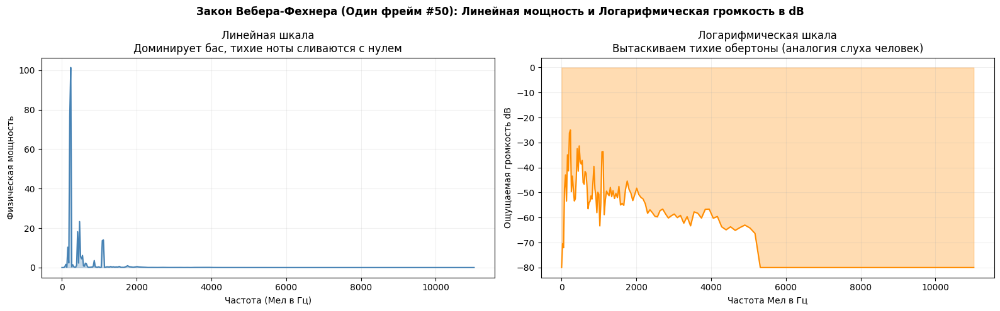

In [33]:
FRAME_IDX_MEL = 50  # анализируем один фрейм
S_mel_linear = mel_results[1]["S_mel"]    # ватты
S_mel_log    = mel_results[1]["S_mel_db"] # Дб

frame_linear = S_mel_linear[:, FRAME_IDX_MEL]
frame_log    = S_mel_log[:, FRAME_IDX_MEL]
mel_freqs    = librosa.mel_frequencies(n_mels=128, fmin=0, fmax=TARGET_SR // 2)

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
fig.suptitle(f'Закон Вебера-Фехнера (Один фрейм #{FRAME_IDX_MEL}): Линейная мощность и Логарифмическая громкость в dB', fontsize=12, fontweight='bold')

# линейная шкала
axes[0].plot(mel_freqs, frame_linear, color='steelblue', linewidth=1.5)
axes[0].fill_between(mel_freqs, frame_linear, alpha=0.3, color='steelblue')
axes[0].set_xlabel('Частота (Мел в Гц)')
axes[0].set_ylabel('Физическая мощность')
axes[0].set_title('Линейная шкала\nДоминирует бас, тихие ноты сливаются с нулем')
axes[0].grid(alpha=0.2)

# логарифмическая шкала dB
axes[1].plot(mel_freqs, frame_log, color='darkorange', linewidth=1.5)
axes[1].fill_between(mel_freqs, frame_log, alpha=0.3, color='darkorange')
axes[1].set_xlabel('Частота Мел в Гц')
axes[1].set_ylabel('Ощущаемая громкость dB')
axes[1].set_title('Логарифмическая шкала\nВытаскиваем тихие обертоны (аналогия слуха человек)')
axes[1].grid(alpha=0.2)

plt.tight_layout()
plt.savefig('block4_weber_fechner.png', dpi=150, bbox_inches='tight')
plt.show()

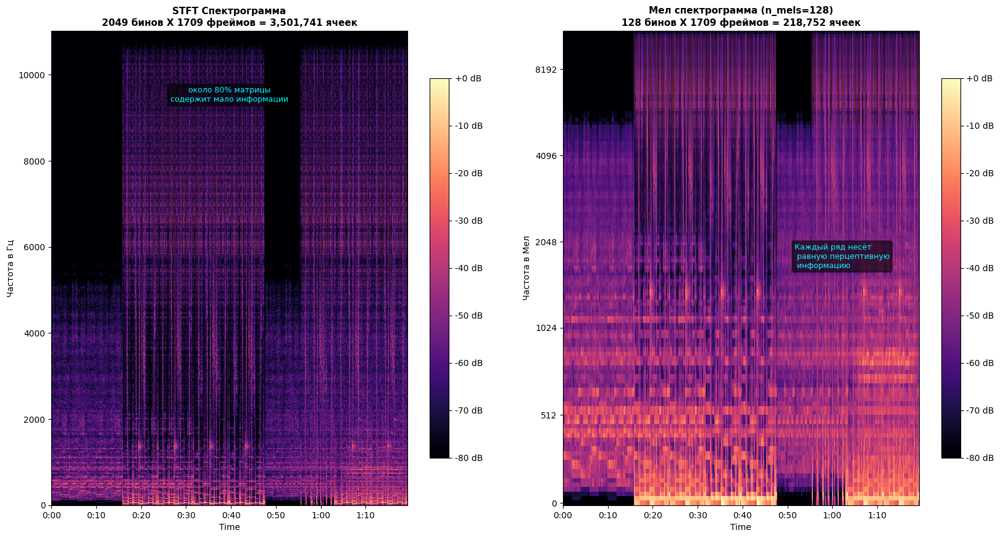

In [34]:
fig = plt.figure(figsize=(20, 10))
gs  = gridspec.GridSpec(2, 4, figure=fig, hspace=0.4, wspace=0.35)

# STFT для всего трека
ax_stft = fig.add_subplot(gs[:, :2])
img_stft = librosa.display.specshow(D_db, sr=TARGET_SR, hop_length=HOP_FINAL, x_axis='time', y_axis='hz', cmap='magma', ax=ax_stft)
fig.colorbar(img_stft, ax=ax_stft, format='%+2.0f dB', shrink=0.8)
ax_stft.set_title(f'STFT Спектрограмма\n{D_db.shape[0]} бинов Х {D_db.shape[1]} фреймов = {D_db.size:,} ячеек', fontsize=11, fontweight='bold')
ax_stft.set_ylabel('Частота в Гц')

ax_stft.annotate('около 80% матрицы\nсодержит мало информации', xy=(0.5, 0.85), xycoords='axes fraction', fontsize=9, color='cyan', ha='center', bbox=dict(boxstyle='round', facecolor='black', alpha=0.6))

# Мел спектрограмма (n_mels=128)
ax_mel = fig.add_subplot(gs[:, 2:])
img_mel = librosa.display.specshow(S_mel_db_main, sr=TARGET_SR, hop_length=HOP_FINAL, x_axis='time', y_axis='mel', cmap='magma', ax=ax_mel)
fig.colorbar(img_mel, ax=ax_mel, format='%+2.0f dB', shrink=0.8)
ax_mel.set_title(f'Мел спектрограмма (n_mels=128)\n128 бинов Х {S_mel_db_main.shape[1]} фреймов = {S_mel_db_main.size:,} ячеек', fontsize=11, fontweight='bold')
ax_mel.set_ylabel('Частота в Мел')

ax_mel.annotate('Каждый ряд несёт\n равную перцептивную\n информацию', xy=(0.65, 0.5), xycoords='axes fraction', fontsize=9, color='cyan', bbox=dict(boxstyle='round', facecolor='black', alpha=0.6))

plt.savefig('block4_stftmel.png', dpi=150, bbox_inches='tight')
plt.show()

In [35]:
def get_mel_spectrogram(audio: np.ndarray, sr: int, n_fft: int = 4096, hop_length: int = 1024, n_mels: int = 128) -> np.ndarray:
    """аудиосигнал в Мел спектрограмму"""
    S_mel = librosa.feature.melspectrogram(y=audio, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels, window='hann', fmax=sr // 2)
    return librosa.power_to_db(S_mel, ref=np.max)

# ИТОГ
compression_freq = D_db.shape[0] / 128
compression_total = D_db.size / (128 * D_db.shape[1])

In [36]:
print(f"Алгоритм: STFT в Mel фильтр (128) в log (dB)")
print(f"Размер входа: {S_mel_db_main.shape} ({S_mel_db_main.size:,} ячеек)")
print(f"Сжатие: {compression_freq:.0f}x по частоте | {compression_total:.0f}x общий объем")
"""Шкала Мел сжимает ВЧ как слух человека, Децибелы вытягивают тихие обертоны.
дальше Передача матрицы в OpenL3 для извлечения 512-мерных эмбеддингов."""

Алгоритм: STFT в Mel фильтр (128) в log (dB)
Размер входа: (128, 1709) (218,752 ячеек)
Сжатие: 16x по частоте | 16x общий объем


'Шкала Мел сжимает ВЧ как слух человека, Децибелы вытягивают тихие обертоны.\nдальше Передача матрицы в OpenL3 для извлечения 512-мерных эмбеддингов.'

**БЛОК 5. Нейросетевые эмбеддинги с OpenL3**

In [37]:
import numpy as np
import librosa
import librosa.display
import openl3
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.colors import Normalize
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_similarity
import warnings

warnings.filterwarnings('ignore')

In [38]:
# проверки окружения
print(f"  TensorFlow:  {tf.__version__}")
print(f"  OpenL3:      {openl3.__version__}")
print(f"  NumPy:       {np.__version__}")
print(f"  Librosa:     {librosa.__version__}")

  TensorFlow:  2.20.0
  OpenL3:      0.4.2
  NumPy:       2.2.6
  Librosa:     0.11.0


In [39]:
# сигнал из блока 1
print(f"  sr = {TARGET_SR} Гц, длина = {len(y_normalized)/TARGET_SR:.2f} с")

  sr = 22050 Гц, длина = 79.34 с


In [40]:
# архитектура OpenL3
"""  wav → Mel-Spectrogram(256 mel, 199 frames)")
→ Conv2D(64,3x3) → BN → ReLU → MaxPool")
→ Conv2D(128,3x3) → BN → ReLU → MaxPool")
→ Conv2D(256,3x3) → BN → ReLU → MaxPool")
→ Conv2D(512,3x3) → BN → ReLU → MaxPool")
→ GlobalAveragePool → Dense(512) → L2-Norm"
→ Embedding [512 чисел]"""

'  wav → Mel-Spectrogram(256 mel, 199 frames)")\n→ Conv2D(64,3x3) → BN → ReLU → MaxPool")\n→ Conv2D(128,3x3) → BN → ReLU → MaxPool")\n→ Conv2D(256,3x3) → BN → ReLU → MaxPool")\n→ Conv2D(512,3x3) → BN → ReLU → MaxPool")\n→ GlobalAveragePool → Dense(512) → L2-Norm"\n→ Embedding [512 чисел]'

In [41]:
# Для максимальной точности используем mel256, хотя в Блоке 4 мы анализировали 128
INPUT_REPR     = "mel256" 
CONTENT_TYPE   = "music"
EMBEDDING_SIZE = 512

In [42]:
# загружаем модель
print(f"  input_repr     = {INPUT_REPR}")
print(f"  content_type   = {CONTENT_TYPE}")
print(f"  embedding_size = {EMBEDDING_SIZE}")

model = openl3.models.load_audio_embedding_model(
    input_repr=INPUT_REPR,
    content_type=CONTENT_TYPE,
    embedding_size=EMBEDDING_SIZE
)
print(f"Модель загружена")
print(f"Всего параметров: {model.count_params():,}")

  input_repr     = mel256
  content_type   = music
  embedding_size = 512

Модель загружена
Всего параметров: 4,689,860


In [43]:
HOP_SIZE = 0.1   # каждые 100 мс — новый вектор
print(f"\nВычисляем эмбеддинги...")
print(f"  hop_size = {HOP_SIZE} с → один вектор каждые {HOP_SIZE*1000:.0f} мс")
print(f"  Ожидаем ≈ {int(len(y_normalized)/TARGET_SR / HOP_SIZE)} векторов")

emb, ts = openl3.get_audio_embedding(
    y_normalized.astype(np.float32),
    TARGET_SR,
    model=model,
    hop_size=HOP_SIZE,
    center=True,
    verbose=1
)

print(f"  Форма матрицы: {emb.shape}")
print(f"  Количество окон: {emb.shape[0]}")
print(f"  Размерность вектора: {emb.shape[1]} 512 акустических признаков")
print(f"  Временные метки: от {ts[0]:.2f} до {ts[-1]:.2f} с")
print(f"  Тип данных: {emb.dtype}")
print(f"  Размер в памяти: {emb.nbytes / 1024:.1f} КБ")


Вычисляем эмбеддинги...
  hop_size = 0.1 с → один вектор каждые 100 мс
  Ожидаем ≈ 793 векторов
25/25 ━━━━━━━━━━━━━━━━━━━━ 69s 3s/step
  Форма матрицы: (790, 512)
  Количество окон: 790
  Размерность вектора: 512 512 акустических признаков
  Временные метки: от 0.00 до 78.90 с
  Тип данных: float32
  Размер в памяти: 1580.0 КБ


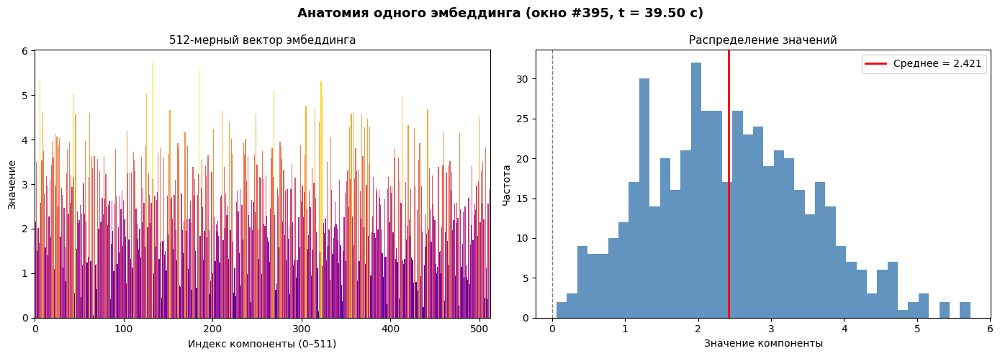

In [44]:
WINDOW_IDX = len(ts) // 2   # берём вектор из середины трека
vec = emb[WINDOW_IDX]

# как студийный микрофон подбирается под уникальный вокальный профиль, 
# эти 512 чисел служат математическим отпечатком уникального акустического тембра.
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle(f'Анатомия одного эмбеддинга (окно #{WINDOW_IDX}, t = {ts[WINDOW_IDX]:.2f} с)', 
             fontsize=13, fontweight='bold')

axes[0].bar(range(len(vec)), vec, color=plt.cm.plasma(Normalize()(vec)), width=1.0, linewidth=0)
axes[0].set_xlabel('Индекс компоненты (0–511)')
axes[0].set_ylabel('Значение')
axes[0].set_title('512-мерный вектор эмбеддинга', fontsize=11)
axes[0].set_xlim(0, 512)

axes[1].hist(vec, bins=40, color='steelblue', edgecolor='none', alpha=0.85)
axes[1].axvline(vec.mean(), color='red', linewidth=2, label=f'Среднее = {vec.mean():.3f}')
axes[1].axvline(0, color='gray', linewidth=1, linestyle='--')
axes[1].set_xlabel('Значение компоненты')
axes[1].set_ylabel('Частота')
axes[1].set_title('Распределение значений', fontsize=11)
axes[1].legend()

plt.tight_layout()
plt.savefig('block5_single_embedding.png', dpi=150, bbox_inches='tight')
plt.show()

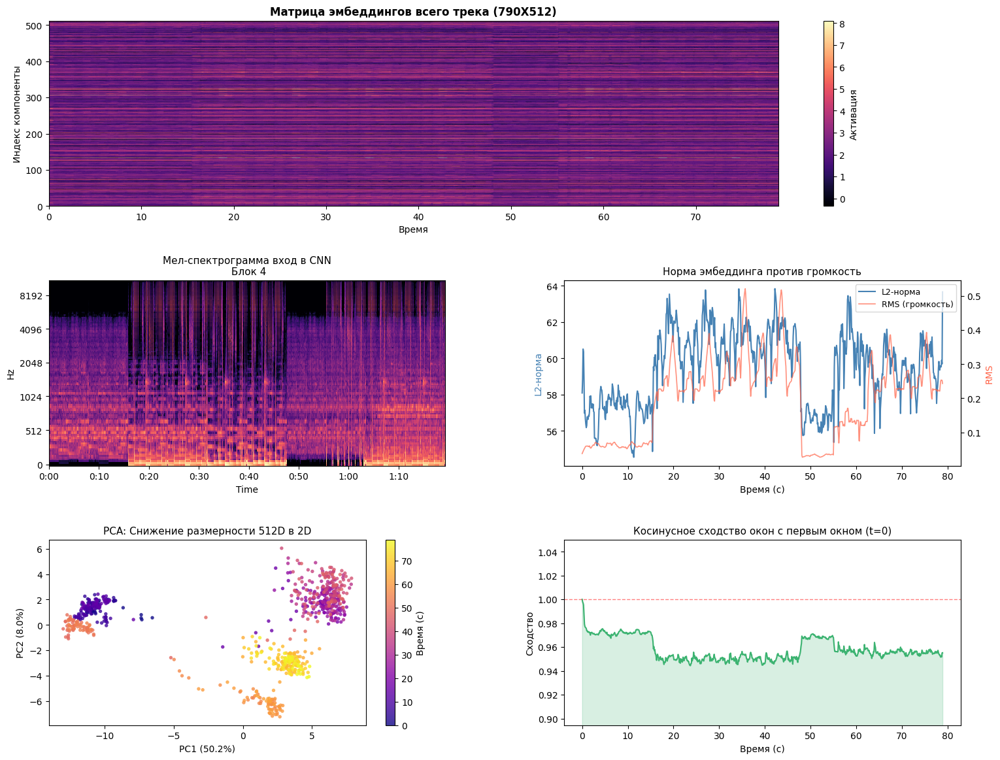

In [45]:
fig = plt.figure(figsize=(18, 14))
gs  = gridspec.GridSpec(3, 2, figure=fig, hspace=0.4, wspace=0.3)

# хитмэп эмбеддингов
ax1 = fig.add_subplot(gs[0, :])
im  = ax1.imshow(emb.T, aspect='auto', origin='lower', cmap='magma', 
                 extent=[ts[0], ts[-1], 0, EMBEDDING_SIZE])
fig.colorbar(im, ax=ax1).set_label('Активация')
ax1.set_title(f'Матрица эмбеддингов всего трека ({emb.shape[0]}Х{emb.shape[1]})', fontsize=12, fontweight='bold')
ax1.set_xlabel('Время')
ax1.set_ylabel('Индекс компоненты')

# Мел спектрограмма на вход
ax2 = fig.add_subplot(gs[1, 0])
S_mel = librosa.feature.melspectrogram(y=y_normalized, sr=TARGET_SR, n_fft=2048, hop_length=512, n_mels=128)
S_mel_db = librosa.power_to_db(S_mel, ref=np.max)
librosa.display.specshow(S_mel_db, sr=TARGET_SR, hop_length=512, x_axis='time', y_axis='mel', cmap='magma', ax=ax2)
ax2.set_title('Мел-спектрограмма вход в CNN\n Блок 4', fontsize=11)

# норма эмбеддинга против громкость
ax3 = fig.add_subplot(gs[1, 1])
norms = np.linalg.norm(emb, axis=1)
rms   = librosa.feature.rms(y=y_normalized, frame_length=int(TARGET_SR*1.0), hop_length=int(TARGET_SR*HOP_SIZE))[0]
rms_times = np.arange(len(rms)) * HOP_SIZE

ax3.plot(ts, norms, color='steelblue', linewidth=1.5, label='L2-норма')
ax3_r = ax3.twinx()
ax3_r.plot(rms_times[:len(ts)], rms[:len(ts)], color='tomato', linewidth=1.2, alpha=0.7, label='RMS (громкость)')
ax3.set_xlabel('Время (с)')
ax3.set_ylabel('L2-норма', color='steelblue')
ax3_r.set_ylabel('RMS', color='tomato')
ax3.set_title('Норма эмбеддинга против громкость', fontsize=11)
lines = ax3.get_lines() + ax3_r.get_lines()
ax3.legend(lines, [l.get_label() for l in lines], loc='upper right', fontsize=9)

# PCA 512D → 2D
ax4 = fig.add_subplot(gs[2, 0])
pca  = PCA(n_components=2)
emb_2d = pca.fit_transform(emb)
scatter = ax4.scatter(emb_2d[:, 0], emb_2d[:, 1], c=ts, cmap='plasma', s=15, alpha=0.8, linewidths=0)
fig.colorbar(scatter, ax=ax4).set_label('Время (с)')
ax4.set_title('PCA: Снижение размерности 512D в 2D', fontsize=11)
ax4.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)')
ax4.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)')

# косинусное расстояние от t=0
ax5 = fig.add_subplot(gs[2, 1])
cos_sims = cosine_similarity(emb[0:1], emb)[0]
ax5.plot(ts, cos_sims, color='mediumseagreen', linewidth=1.5)
ax5.fill_between(ts, cos_sims, 0.5, alpha=0.2, color='mediumseagreen')
ax5.axhline(1.0, color='red', linestyle='--', linewidth=1, alpha=0.5)
ax5.set_xlabel('Время (с)')
ax5.set_ylabel('Сходство')
ax5.set_title('Косинусное сходство окон с первым окном (t=0)', fontsize=11)
ax5.set_ylim(min(cos_sims)-0.05, 1.05)

plt.tight_layout()
plt.savefig('block5_embedding_analysis.png', dpi=150, bbox_inches='tight')
plt.show()


Косинусное сходство фрагментов с полным треком:
  Начало      : t=[0.0, 10.0] с в сходство = 0.9828
  Середина    : t=[34.7, 44.7] с в сходство = 0.9941
  Конец       : t=[69.3, 79.3] с в сходство = 0.9953


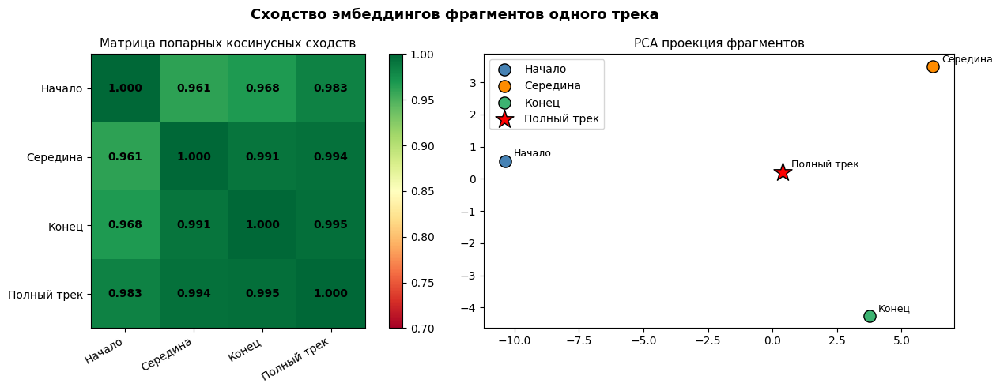

In [46]:
# фрагментация и матрица сходства
duration = len(y_normalized) / TARGET_SR
FRAG_SEC = 10.0
fragments = {
    'Начало':   (0.0, FRAG_SEC),
    'Середина': (duration/2 - FRAG_SEC/2, duration/2 + FRAG_SEC/2),
    'Конец':    (max(0, duration - FRAG_SEC), duration),
}

emb_global = emb.mean(axis=0, keepdims=True)
frag_embs, frag_sims = {}, {}

print("\nКосинусное сходство фрагментов с полным треком:")
for name, (t_start, t_end) in fragments.items():
    s_start, s_end = int(t_start * TARGET_SR), int(t_end * TARGET_SR)
    frag = y_normalized[s_start:s_end].astype(np.float32)
    frag_emb, _ = openl3.get_audio_embedding(frag, TARGET_SR, model=model, hop_size=HOP_SIZE, center=True, verbose=0)
    frag_avg = frag_emb.mean(axis=0, keepdims=True)
    sim = cosine_similarity(emb_global, frag_avg)[0, 0]
    frag_embs[name] = frag_avg
    frag_sims[name] = sim
    print(f"  {name:<12}: t=[{t_start:.1f}, {t_end:.1f}] с в сходство = {sim:.4f}")

frag_names = list(frag_embs.keys()) + ['Полный трек']
all_vecs = np.vstack(list(frag_embs.values()) + [emb_global])
sim_matrix = cosine_similarity(all_vecs)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Сходство эмбеддингов фрагментов одного трека', fontsize=13, fontweight='bold')

im = axes[0].imshow(sim_matrix, cmap='RdYlGn', vmin=0.7, vmax=1.0)
axes[0].set_xticks(range(len(frag_names)))
axes[0].set_yticks(range(len(frag_names)))
axes[0].set_xticklabels(frag_names, rotation=30, ha='right')
axes[0].set_yticklabels(frag_names)
axes[0].set_title('Матрица попарных косинусных сходств', fontsize=11)
for i in range(len(frag_names)):
    for j in range(len(frag_names)):
        color = 'black' if sim_matrix[i, j] > 0.85 else 'white'
        axes[0].text(j, i, f'{sim_matrix[i, j]:.3f}', ha='center', va='center', color=color, fontweight='bold')
fig.colorbar(im, ax=axes[0])

pca2 = PCA(n_components=2)
pts = pca2.fit_transform(all_vecs)
colors = ['steelblue', 'darkorange', 'mediumseagreen', 'red']
for pt, col, lbl in zip(pts, colors, frag_names):
    marker, size = ('*', 300) if lbl == 'Полный трек' else ('o', 120)
    axes[1].scatter(pt[0], pt[1], c=col, s=size, marker=marker, label=lbl, edgecolors='black')
    axes[1].annotate(lbl, pt, textcoords='offset points', xytext=(8, 4), fontsize=9)

axes[1].set_title('PCA проекция фрагментов', fontsize=11)
axes[1].legend()
plt.tight_layout()
plt.show()

  512:  (6, 512) (12.0 КБ)
  6144: (6, 6144) (144.0 КБ)


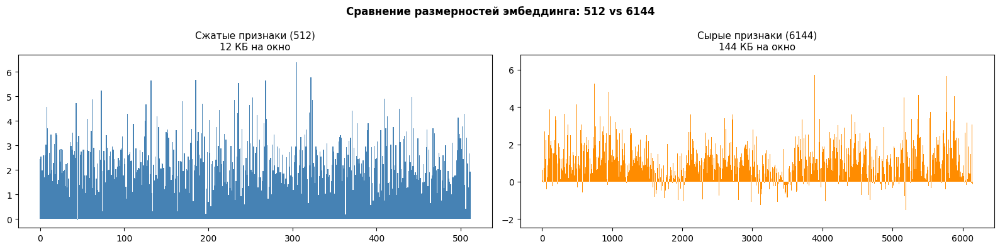

In [47]:
# сравниваем размерностей 512 против 6144
model_6144 = openl3.models.load_audio_embedding_model(
    input_repr=INPUT_REPR, content_type=CONTENT_TYPE, embedding_size=6144
)

clip_5s = y_normalized[:int(5 * TARGET_SR)].astype(np.float32)
emb_512, _  = openl3.get_audio_embedding(clip_5s, TARGET_SR, model=model, hop_size=1.0, verbose=0)
emb_6144, _ = openl3.get_audio_embedding(clip_5s, TARGET_SR, model=model_6144, hop_size=1.0, verbose=0)

print(f"  512:  {emb_512.shape} ({emb_512.nbytes/1024:.1f} КБ)")
print(f"  6144: {emb_6144.shape} ({emb_6144.nbytes/1024:.1f} КБ)")

# Очищаем память от тяжелой модели на 6144
tf.keras.backend.clear_session()
del model_6144

fig, axes = plt.subplots(1, 2, figsize=(16, 4))
fig.suptitle('Сравнение размерностей эмбеддинга: 512 vs 6144', fontsize=12, fontweight='bold')
axes[0].bar(range(512), emb_512[0], color='steelblue', width=1)
axes[0].set_title(f'Сжатые признаки (512)\n{emb_512.nbytes//1024} КБ на окно', fontsize=11)
axes[1].bar(range(6144), emb_6144[0], color='darkorange', width=1)
axes[1].set_title(f'Сырые признаки (6144)\n{emb_6144.nbytes//1024} КБ на окно', fontsize=11)
plt.tight_layout()
plt.show()

In [48]:
def get_track_embedding(audio: np.ndarray, sr: int, model_obj=None, hop_size: float = 0.1, aggregate: str = "mean"):
    """аудиосигнал в агрегированный эмбеддинг"""
    emb_matrix, timestamps = openl3.get_audio_embedding(
        audio.astype(np.float32), sr, model=model_obj, hop_size=hop_size, center=True, verbose=0
    )
    if aggregate == "mean":
        return emb_matrix, timestamps, emb_matrix.mean(axis=0)
    elif aggregate == "max":
        return emb_matrix, timestamps, emb_matrix.max(axis=0)
    return emb_matrix, timestamps, None

# Итоговый лог
emb_mat, ts_out, emb_glob = get_track_embedding(y_normalized, TARGET_SR, model_obj=model)

print("ИТОГ")
print(f"  Вход: Мел-спектрограмма ({INPUT_REPR})")
print(f"  Размерность: {emb_mat.shape[1]} (Компактный акустический профиль)")
print(f"  Форма базы:  {emb_mat.shape[0]} окон")
# в блоке 6 мы работаем с зашумлением

ИТОГ
  Вход: Мел-спектрограмма (mel256)
  Размерность: 512 (Компактный акустический профиль)
  Форма базы:  790 окон


**БЛОК 6: Искусственное зашумление и стресс-тест Constellation Map**

In [49]:
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy.ndimage import maximum_filter
import warnings
import json

warnings.filterwarnings('ignore')

In [50]:
print(f"\n  sr = {TARGET_SR} Гц, длина = {len(y_normalized)/TARGET_SR:.2f} с")
print(f"  Допуск при сравнении пиков (Tolerance): ±2 бина")


  sr = 22050 Гц, длина = 79.34 с
  Допуск при сравнении пиков (Tolerance): ±2 бина


In [51]:
def add_white_noise(signal: np.ndarray, snr_db: float) -> np.ndarray:
    """Белый шум (равномерный спектр) с заданным SNR."""
    signal_power = np.mean(signal ** 2)
    noise_power  = signal_power / (10 ** (snr_db / 10))
    noise        = np.random.normal(0, np.sqrt(noise_power), len(signal))
    return np.clip(signal + noise, -1.0, 1.0).astype(np.float32)

def add_pink_noise(signal: np.ndarray, snr_db: float) -> np.ndarray:
    """Розовый шум (1/f) ближе к реальному фоновому шуму."""
    n = len(signal)
    freqs = np.fft.rfftfreq(n)
    freqs[0] = 1e-10
    pink_fft = np.random.randn(len(freqs)) / np.sqrt(freqs)
    pink_noise = np.fft.irfft(pink_fft, n=n)
    
    signal_power = np.mean(signal ** 2)
    noise_power  = signal_power / (10 ** (snr_db / 10))
    pink_noise  *= np.sqrt(noise_power / (np.mean(pink_noise**2) + 1e-12))
    return np.clip(signal + pink_noise, -1.0, 1.0).astype(np.float32)

def add_clipping(signal: np.ndarray, clip_level: float = 0.5) -> np.ndarray:
    """Клиппирование (перегруз микрофона)"""
    return np.clip(signal, -clip_level, clip_level).astype(np.float32)

def add_gsm_compression(signal: np.ndarray, sr: int) -> np.ndarray:
    """Имитация GSM-кодека: 22050 в 8000 (8-bit) в 22050 Гц."""
    GSM_SR = 8000
    y_8k = librosa.resample(signal, orig_sr=sr, target_sr=GSM_SR)
    y_8bit = np.round(y_8k * 127) / 127
    y_back = librosa.resample(y_8bit.astype(np.float32), orig_sr=GSM_SR, target_sr=sr)
    
    # Безопасное выравнивание длины
    if len(y_back) > len(signal):
        y_back = y_back[:len(signal)]
    elif len(y_back) < len(signal):
        y_back = np.pad(y_back, (0, len(signal) - len(y_back)), mode='constant')
    return y_back.astype(np.float32)

def add_reverb(signal: np.ndarray, sr: int, room_size: float = 0.4, n_reflections: int = 8) -> np.ndarray:
    """Реверберация (эхо в помещении)."""
    output = signal.copy().astype(np.float64)
    max_delay_ms = 150 * room_size
    for i in range(1, n_reflections + 1):
        delay_samples = int(sr * max_delay_ms / 1000 * (i / n_reflections))
        decay = (1 - room_size) ** i * 0.6
        if delay_samples < len(signal):
            output[delay_samples:] += decay * signal[:len(signal)-delay_samples]
    return (output / (np.max(np.abs(output)) + 1e-12)).astype(np.float32)

In [52]:
# анализируем пики
def compute_constellation(audio, sr, n_fft, hop_length, neighborhood, threshold_db):
    D = librosa.stft(audio, n_fft=n_fft, hop_length=hop_length, window='hann')
    D_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
    struct = np.ones((neighborhood, neighborhood), dtype=bool)
    local_max = maximum_filter(D_db, footprint=struct)
    mask = (D_db == local_max) & (D_db > threshold_db)
    fi, ti = np.where(mask)
    return fi, ti, D_db

def peak_survival_rate(fi_clean, ti_clean, fi_noisy, ti_noisy, tolerance: int = 2) -> dict:
    """Оптимизированный расчет выживших пиков."""
    n_clean, n_noisy = len(fi_clean), len(fi_noisy)
    if n_clean == 0: return {"psr": 0, "survived": 0, "n_clean": 0, "n_noisy": n_noisy, "new_peaks": n_noisy}
    
    noisy_set = set(zip(fi_noisy.tolist(), ti_noisy.tolist()))
    survived = 0
    
    for f, t in zip(fi_clean.tolist(), ti_clean.tolist()):
        # Генерируем окрестность пика и проверяем пересечение с множеством шумных пиков
        neighborhood_points = {(f + df, t + dt) for df in range(-tolerance, tolerance + 1) for dt in range(-tolerance, tolerance + 1)}
        if not noisy_set.isdisjoint(neighborhood_points):
            survived += 1
            
    return {
        "psr": (survived / n_clean) * 100,
        "survived": survived,
        "n_clean": n_clean,
        "n_noisy": n_noisy,
        "new_peaks": max(0, n_noisy - survived),
    }

# Вычисляем эталон (чистый трек)
fi_clean, ti_clean, D_db_clean = compute_constellation(y_normalized, TARGET_SR, N_FFT_FINAL, HOP_FINAL, NEIGHBORHOOD, THRESHOLD_DB)
freqs_clean = librosa.fft_frequencies(sr=TARGET_SR, n_fft=N_FFT_FINAL)[fi_clean]
times_clean = librosa.frames_to_time(ti_clean, sr=TARGET_SR, hop_length=HOP_FINAL)

In [53]:
# тестируем все сценарии
PEAK_TOLERANCE = 2

DEGRADATION_TESTS = [
    {"name": "Белый шум\nSNR=+20 dB", "type": "white", "param": 20, "color": "#4CAF50"},
    {"name": "Белый шум\nSNR=+6 dB",  "type": "white", "param": 6,  "color": "#8BC34A"},
    {"name": "Белый шум\nSNR= 0 dB",  "type": "white", "param": 0,  "color": "#FFC107"},
    {"name": "Белый шум\nSNR=-6 dB",  "type": "white", "param": -6, "color": "#FF5722"},
    {"name": "Розовый шум\nSNR=+6 dB","type": "pink",  "param": 6,  "color": "#9C27B0"},
    {"name": "Розовый шум\nSNR= 0 dB","type": "pink",  "param": 0,  "color": "#673AB7"},
    {"name": "Клиппинг\n50% порог",   "type": "clip",  "param": 0.5,"color": "#2196F3"},
    {"name": "Клиппинг\n25% порог",   "type": "clip",  "param": 0.25,"color": "#03A9F4"},
    {"name": "GSM кодек\n8kHz→22kHz", "type": "gsm",   "param": None,"color": "#009688"},
    {"name": "Реверб\nразмер=0.4",    "type": "reverb","param": 0.4,"color": "#795548"},
    {"name": "Реверб\nразмер=0.8",    "type": "reverb","param": 0.8,"color": "#607D8B"},
]

print(f"\nЗапускаем {len(DEGRADATION_TESTS)} тестов деградации...")
results = []

for test in DEGRADATION_TESTS:
    if test["type"] == "white":   y_degraded = add_white_noise(y_normalized, test["param"])
    elif test["type"] == "pink":  y_degraded = add_pink_noise(y_normalized, test["param"])
    elif test["type"] == "clip":  y_degraded = add_clipping(y_normalized, test["param"])
    elif test["type"] == "gsm":   y_degraded = add_gsm_compression(y_normalized, TARGET_SR)
    elif test["type"] == "reverb":y_degraded = add_reverb(y_normalized, TARGET_SR, test["param"])

    fi_noisy, ti_noisy, D_db_noisy = compute_constellation(y_degraded, TARGET_SR, N_FFT_FINAL, HOP_FINAL, NEIGHBORHOOD, THRESHOLD_DB)
    stats = peak_survival_rate(fi_clean, ti_clean, fi_noisy, ti_noisy, tolerance=PEAK_TOLERANCE)
    
    results.append({**test, **stats, "y_degraded": y_degraded, "fi_noisy": fi_noisy, "ti_noisy": ti_noisy, "D_db_noisy": D_db_noisy})
    print(f"  {test['name'].replace(chr(10), ' '):<30} PSR={stats['psr']:5.1f}% | выжило={stats['survived']:4d}/{stats['n_clean']} | новых={stats['new_peaks']:4d}")


Запускаем 11 тестов деградации...
  Белый шум SNR=+20 dB           PSR= 87.5% | выжило=1743/1991 | новых= 323
  Белый шум SNR=+6 dB            PSR= 60.2% | выжило=1199/1991 | новых=7044
  Белый шум SNR= 0 dB            PSR= 35.5% | выжило= 706/1991 | новых=7689
  Белый шум SNR=-6 dB            PSR= 18.6% | выжило= 371/1991 | новых=8116
  Розовый шум SNR=+6 dB          PSR= 95.4% | выжило=1900/1991 | новых= 149
  Розовый шум SNR= 0 dB          PSR= 78.3% | выжило=1559/1991 | новых= 728
  Клиппинг 50% порог             PSR= 81.1% | выжило=1615/1991 | новых=1172
  Клиппинг 25% порог             PSR= 62.6% | выжило=1247/1991 | новых=2589
  GSM кодек 8kHz→22kHz           PSR= 64.1% | выжило=1277/1991 | новых=  41
  Реверб размер=0.4              PSR= 59.5% | выжило=1184/1991 | новых=1532
  Реверб размер=0.8              PSR= 83.7% | выжило=1666/1991 | новых= 622


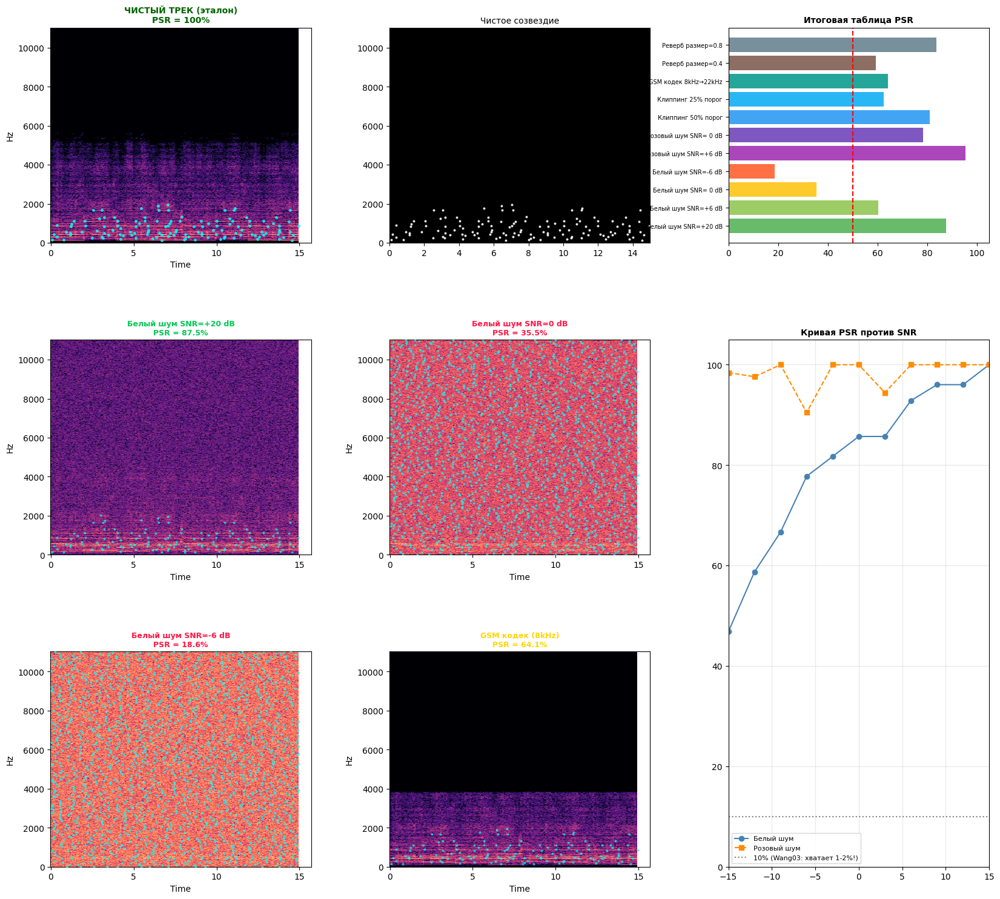

In [54]:
KEY_TESTS = [{"idx": 0, "label": "Белый шум SNR=+20 dB"}, {"idx": 2, "label": "Белый шум SNR=0 dB"},
             {"idx": 3, "label": "Белый шум SNR=-6 dB"}, {"idx": 8, "label": "GSM кодек (8kHz)"}]

ZOOM_SEC = 15.0
zoom_mask_c = times_clean <= ZOOM_SEC
fig = plt.figure(figsize=(20, 18))
gs  = gridspec.GridSpec(3, 3, figure=fig, hspace=0.45, wspace=0.3)

# Эталон
ax_ref_spec = fig.add_subplot(gs[0, 0])
librosa.display.specshow(D_db_clean[:, :int(ZOOM_SEC * TARGET_SR / HOP_FINAL)], sr=TARGET_SR, hop_length=HOP_FINAL, x_axis='time', y_axis='hz', cmap='magma', ax=ax_ref_spec)
ax_ref_spec.scatter(times_clean[zoom_mask_c], freqs_clean[zoom_mask_c], c='cyan', s=12, alpha=0.85, linewidths=0, zorder=5)
ax_ref_spec.set_title(f'ЧИСТЫЙ ТРЕК (эталон)\nPSR = 100%', fontsize=10, fontweight='bold', color='darkgreen')

ax_ref_const = fig.add_subplot(gs[0, 1])
ax_ref_const.set_facecolor('black')
ax_ref_const.scatter(times_clean[zoom_mask_c], freqs_clean[zoom_mask_c], c='white', s=8, alpha=0.9, linewidths=0)
ax_ref_const.set_title('Чистое созвездие', fontsize=10)
ax_ref_const.set_xlim(0, ZOOM_SEC); ax_ref_const.set_ylim(0, TARGET_SR // 2)

# PSR Bar chart
ax_bar = fig.add_subplot(gs[0, 2])
bars = ax_bar.barh(range(len(results)), [r["psr"] for r in results], color=[r["color"] for r in results], alpha=0.85)
ax_bar.axvline(50, color='red', linestyle='--', label='50% порог')
ax_bar.set_yticks(range(len(results))); ax_bar.set_yticklabels([r["name"].replace("\n", " ") for r in results], fontsize=7)
ax_bar.set_title('Итоговая таблица PSR', fontsize=10, fontweight='bold')
ax_bar.set_xlim(0, 105)

# Сценарии
for pos, key in zip([(1, 0), (1, 1), (2, 0), (2, 1)], KEY_TESTS):
    r, ax = results[key["idx"]], fig.add_subplot(gs[pos[0], pos[1]])
    tm_n, fr_n = librosa.frames_to_time(r["ti_noisy"], sr=TARGET_SR, hop_length=HOP_FINAL), librosa.fft_frequencies(sr=TARGET_SR, n_fft=N_FFT_FINAL)[r["fi_noisy"]]
    zmask_n = tm_n <= ZOOM_SEC
    librosa.display.specshow(r["D_db_noisy"][:, :int(ZOOM_SEC * TARGET_SR / HOP_FINAL)], sr=TARGET_SR, hop_length=HOP_FINAL, x_axis='time', y_axis='hz', cmap='magma', ax=ax)
    ax.scatter(tm_n[zmask_n], fr_n[zmask_n], c='cyan', s=8, alpha=0.7, linewidths=0, zorder=5)
    ax.set_title(f'{key["label"]}\nPSR = {r["psr"]:.1f}%', fontsize=9, fontweight='bold', color='#00C853' if r['psr'] > 70 else '#FFD600' if r['psr'] > 40 else '#FF1744')
    ax.set_ylim(0, TARGET_SR // 2)

# SNR Кривая
ax_curve = fig.add_subplot(gs[1:, 2])
snr_range = [-15, -12, -9, -6, -3, 0, 3, 6, 9, 12, 15]
psr_white, psr_pink = [], []
fi_c15, ti_c15 = fi_clean[times_clean <= 15.0], ti_clean[times_clean <= 15.0]

for snr in snr_range:
    fw, tw, _ = compute_constellation(add_white_noise(y_normalized[:int(15 * TARGET_SR)], snr), TARGET_SR, N_FFT_FINAL, HOP_FINAL, NEIGHBORHOOD, THRESHOLD_DB)
    psr_white.append(peak_survival_rate(fi_c15, ti_c15, fw, tw, PEAK_TOLERANCE)["psr"])
    fp, tp, _ = compute_constellation(add_pink_noise(y_normalized[:int(15 * TARGET_SR)], snr), TARGET_SR, N_FFT_FINAL, HOP_FINAL, NEIGHBORHOOD, THRESHOLD_DB)
    psr_pink.append(peak_survival_rate(fi_c15, ti_c15, fp, tp, PEAK_TOLERANCE)["psr"])

ax_curve.plot(snr_range, psr_white, 'o-', color='steelblue', label='Белый шум')
ax_curve.plot(snr_range, psr_pink, 's--', color='darkorange', label='Розовый шум')
ax_curve.axhline(10, color='gray', linestyle=':', label='10% (Wang03: хватает 1-2%!)')
ax_curve.set_title('Кривая PSR против SNR', fontsize=10, fontweight='bold')
ax_curve.legend(fontsize=8); ax_curve.set_xlim(-15, 15); ax_curve.set_ylim(0, 105); ax_curve.grid(alpha=0.3)

plt.tight_layout()
plt.savefig('block6_constellation_noise_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

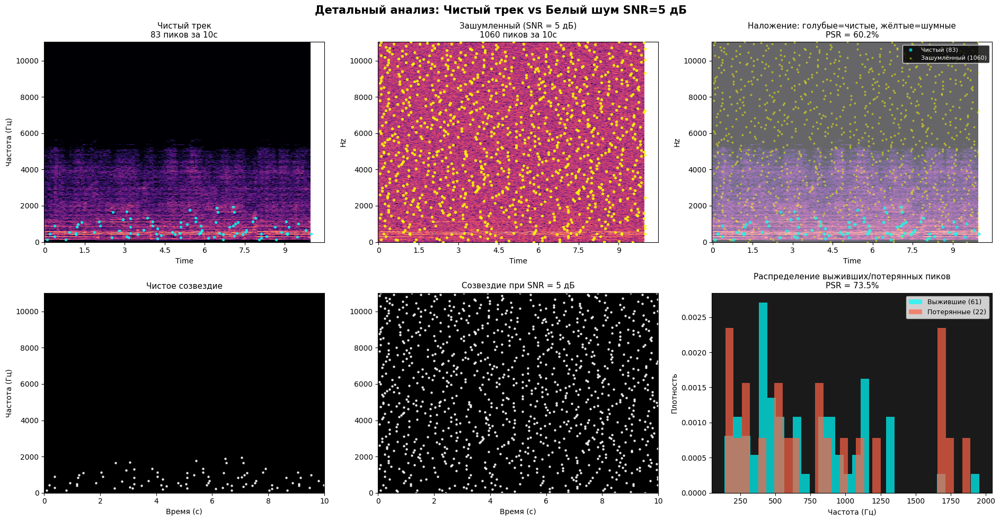

  ИТОГОВАЯ ТАБЛИЦА УСТОЙЧИВОСТИ CONSTELLATION MAP
  Белый шум SNR=+20 dB            87.5%      1743       323  Хорошо
  Белый шум SNR=+6 dB             60.2%      1199      7044  Умеренно
  Белый шум SNR= 0 dB             35.5%       706      7689  Сложно
  Белый шум SNR=-6 dB             18.6%       371      8116  Сложно
  Розовый шум SNR=+6 dB           95.4%      1900       149  Хорошо
  Розовый шум SNR= 0 dB           78.3%      1559       728  Хорошо
  Клиппинг 50% порог              81.1%      1615      1172  Хорошо
  Клиппинг 25% порог              62.6%      1247      2589  Умеренно
  GSM кодек 8kHz→22kHz            64.1%      1277        41  Умеренно
  Реверб размер=0.4               59.5%      1184      1532  Умеренно
  Реверб размер=0.8               83.7%      1666       622  Хорошо


In [ ]:
TARGET_INDEX = 1
r_5db = results[TARGET_INDEX]   

fi_5  = r_5db["fi_noisy"]
ti_5  = r_5db["ti_noisy"]
fr_5  = librosa.fft_frequencies(sr=TARGET_SR, n_fft=N_FFT_FINAL)[fi_5]
tm_5  = librosa.frames_to_time(ti_5, sr=TARGET_SR, hop_length=HOP_FINAL)

# Zoom на первые 10 секунд
Z = 10.0
zm_c = times_clean <= Z
zm_5 = tm_5 <= Z

fig, axes = plt.subplots(2, 3, figsize=(19, 10))
fig.suptitle('Детальный анализ: Чистый трек vs Белый шум SNR=5 дБ', fontsize=15, fontweight='bold')

# график 1 чистый (axes[0, 0])
librosa.display.specshow(D_db_clean[:, :int(Z * TARGET_SR / HOP_FINAL)], sr=TARGET_SR, hop_length=HOP_FINAL, x_axis='time', y_axis='hz', cmap='magma', ax=axes[0, 0])
axes[0, 0].scatter(times_clean[zm_c], freqs_clean[zm_c], c='cyan', s=15, alpha=0.85, linewidths=0, zorder=5)
axes[0, 0].set_title(f'Чистый трек\n{zm_c.sum()} пиков за {Z:.0f}с', fontsize=11)
axes[0, 0].set_ylabel('Частота (Гц)')

# график 2 Зашумлённый (axes[0, 1])
librosa.display.specshow(r_5db["D_db_noisy"][:, :int(Z * TARGET_SR / HOP_FINAL)], sr=TARGET_SR, hop_length=HOP_FINAL, x_axis='time', y_axis='hz', cmap='magma', ax=axes[0, 1])
axes[0, 1].scatter(tm_5[zm_5], fr_5[zm_5], c='yellow', s=15, alpha=0.85, linewidths=0, zorder=5)
axes[0, 1].set_title(f'Зашумленный (SNR = 5 дБ)\n{zm_5.sum()} пиков за {Z:.0f}с', fontsize=11)

# график 3 Наложение (axes[0, 2])
librosa.display.specshow(D_db_clean[:, :int(Z * TARGET_SR / HOP_FINAL)], sr=TARGET_SR, hop_length=HOP_FINAL, x_axis='time', y_axis='hz', cmap='magma', ax=axes[0, 2], alpha=0.6)
axes[0, 2].scatter(times_clean[zm_c], freqs_clean[zm_c], c='cyan', s=20, alpha=0.7, linewidths=0, zorder=5, label=f'Чистый ({zm_c.sum()})')
axes[0, 2].scatter(tm_5[zm_5], fr_5[zm_5], c='yellow', s=8, alpha=0.5, linewidths=0, zorder=4, label=f'Зашумлённый ({zm_5.sum()})')
axes[0, 2].set_title(f'Наложение: голубые=чистые, жёлтые=шумные\nPSR = {r_5db["psr"]:.1f}%', fontsize=11)
axes[0, 2].legend(fontsize=8, facecolor='black', edgecolor='white', labelcolor='white')

# графики 4 и 5 черные созвездия (axes[1, 0] и axes[1, 1])
for i in range(2):
    axes[1, i].set_facecolor('black')
    axes[1, i].set_xlabel('Время (с)')
    axes[1, i].set_xlim(0, Z)
    axes[1, i].set_ylim(0, TARGET_SR // 2)

axes[1, 0].scatter(times_clean[zm_c], freqs_clean[zm_c], c='white', s=10, alpha=0.9, linewidths=0)
axes[1, 0].set_title('Чистое созвездие', fontsize=11)
axes[1, 0].set_ylabel('Частота (Гц)')

axes[1, 1].scatter(tm_5[zm_5], fr_5[zm_5], c='white', s=10, alpha=0.9, linewidths=0)
axes[1, 1].set_title('Созвездие при SNR = 5 дБ', fontsize=11)

# график 6 гистограмма выживших/потерянных пиков (axes[1, 2])
survived_freqs = []
new_freqs      = []
noisy_set_full = set(zip(fi_5.tolist(), ti_5.tolist()))

for f, t in zip(fi_clean[zm_c], ti_clean[zm_c]):
    hz = librosa.fft_frequencies(sr=TARGET_SR, n_fft=N_FFT_FINAL)[f]
    found = any((f+df, t+dt) in noisy_set_full
                for df in range(-PEAK_TOLERANCE, PEAK_TOLERANCE+1)
                for dt in range(-PEAK_TOLERANCE, PEAK_TOLERANCE+1))
    if found:
        survived_freqs.append(hz)
    else:
        new_freqs.append(hz)

axes[1, 2].hist(survived_freqs, bins=30, color='cyan', alpha=0.7, label=f'Выжившие ({len(survived_freqs)})', density=True)
if len(new_freqs) > 0:
    axes[1, 2].hist(new_freqs, bins=30, color='tomato', alpha=0.7, label=f'Потерянные ({len(new_freqs)})', density=True)
axes[1, 2].set_xlabel('Частота (Гц)')
axes[1, 2].set_ylabel('Плотность')
axes[1, 2].set_title(f'Распределение выживших/потерянных пиков\nPSR = {len(survived_freqs)/(len(survived_freqs)+len(new_freqs)+1e-9)*100:.1f}%', fontsize=11)
axes[1, 2].legend(fontsize=9)
axes[1, 2].set_facecolor('#1a1a1a')

for ax in axes.flat:
    ax.set_ylim(bottom=0)

plt.tight_layout()
plt.savefig('block6_clean_vs_noisy_5dB_detail.png', dpi=150, bbox_inches='tight')
plt.show()

print("  ИТОГОВАЯ ТАБЛИЦА УСТОЙЧИВОСТИ CONSTELLATION MAP")
for r in results:
    verdict = "Хорошо" if r["psr"] >= 70 else "Умеренно" if r["psr"] >= 40 else "Сложно"
    print(f"  {r['name'].replace(chr(10), ' '):<30} {r['psr']:>5.1f}%  {r['survived']:>8}  {r['new_peaks']:>8}  {verdict}")

**БЛОК 7: Индексация, Поиск и Верификация**

In [56]:
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from collections import defaultdict
from sklearn.metrics.pairwise import cosine_similarity
import time
import os
import glob
import soundfile as sf
import warnings

warnings.filterwarnings('ignore')

In [57]:
FAN_OUT = 10
T_MIN, T_MAX = 2, 80
MATCH_THRESHOLD = 10  # Порог уверенности

def generate_hashes(fi, ti, fan_out=FAN_OUT, t_min=T_MIN, t_max=T_MAX):
    if len(fi) == 0: return []
    order = np.argsort(ti)
    fi_s, ti_s = fi[order], ti[order]
    hashes = []
    n = len(fi_s)
    for i in range(n):
        f1, t1 = fi_s[i], ti_s[i]
        j_start = np.searchsorted(ti_s, t1 + t_min)
        j_end = np.searchsorted(ti_s, t1 + t_max, side='right')
        if j_start >= j_end: continue
        candidates = np.arange(j_start, j_end)
        if len(candidates) > fan_out:
            candidates = candidates[np.linspace(0, len(candidates)-1, fan_out, dtype=int)]
        for j in candidates:
            f2, t2 = fi_s[j], ti_s[j]
            dt = int(t2 - t1)
            if dt > 0:
                hashes.append(((int(f1), int(f2), dt), int(t1)))
    return hashes

In [58]:
t_idx_start = time.time()
DATABASE = defaultdict(list)
TRACK_REGISTRY = {}
DB_FOLDER = "audio_database" 
wav_files = glob.glob(os.path.join(DB_FOLDER, "*.wav"))

for track_id, file_path in enumerate(wav_files):
    name = os.path.basename(file_path)
    y, _ = librosa.load(file_path, sr=TARGET_SR, mono=True)
    
    if np.max(np.abs(y)) < 1e-4:
        print(f"  [{track_id+1}] {name[:20]:<20} (0 хешей)")
        TRACK_REGISTRY[track_id] = {"name": name, "n_peaks": 0, "path": file_path}
        continue
        
    y_n = y / (np.max(np.abs(y)) + 1e-12)
    fi_db, ti_db, _ = compute_constellation(y_n, TARGET_SR, N_FFT_FINAL, HOP_FINAL, NEIGHBORHOOD, THRESHOLD_DB)
    h_list = generate_hashes(fi_db, ti_db)
    
    for (key, t_anc) in h_list:
        DATABASE[key].append((track_id, t_anc))
        
    TRACK_REGISTRY[track_id] = {"name": name, "n_peaks": len(fi_db), "path": file_path}
    print(f"  [{track_id+1}] {name[:20]:<20} ({len(h_list):,} хешей)")

print(f"\nБаза готова: {len(DATABASE):,} уникальных хешей за {time.time()-t_idx_start:.2f} с")

  [1] audio1.wav           (28,844 хешей)
  [2] audio2.wav           (55,658 хешей)
  [3] audio3.wav           (59,064 хешей)
  [4] audio4.wav           (87,223 хешей)
  [5] audio5.wav           (67,395 хешей)
  [6] audio_frag.wav       (19,779 хешей)
  [7] lose yourself eminem (200,140 хешей)
  [8] nightcrawler travis  (239,634 хешей)
  [9] silence.wav          (0 хешей)
  [10] sonne rammstein.wav  (188,130 хешей)

База готова: 898,256 уникальных хешей за 10.39 с


In [59]:
TARGET_TRACK_IDX = 7
SELECTED_FILE = wav_files[TARGET_TRACK_IDX - 1]

print(f"\nСоздаем запрос из файла: {os.path.basename(SELECTED_FILE)}")
y_full, _ = librosa.load(SELECTED_FILE, sr=TARGET_SR, mono=True)
y_full = y_full / (np.max(np.abs(y_full)) + 1e-12)

Q_START_SEC, Q_DUR = 45.0, 10.0
start_frame = int(Q_START_SEC * TARGET_SR / HOP_FINAL)
s1 = start_frame * HOP_FINAL
s2 = s1 + int(Q_DUR * TARGET_SR)

if s2 > len(y_full):
    s2 = len(y_full)
    s1 = s2 - int(Q_DUR * TARGET_SR)

y_cut = y_full[s1:s2]
y_noisy = add_white_noise(y_cut, snr_db=5)
sf.write('noisy.wav', y_noisy, TARGET_SR)
print(f"Кусок {Q_DUR}с вырезан и зашумлен (SNR=5)")


Создаем запрос из файла: lose yourself eminem.wav
Кусок 10.0с вырезан и зашумлен (SNR=5)


In [60]:
t_search = time.time()

# Загружаем наш "неизвестный" файл
y_query, _ = librosa.load('noisy.wav', sr=TARGET_SR)
y_query = y_query / (np.max(np.abs(y_query)) + 1e-12)

# Constellation и хеши запроса
fi_q, ti_q, _ = compute_constellation(y_query, TARGET_SR, N_FFT_FINAL, HOP_FINAL, NEIGHBORHOOD, THRESHOLD_DB)
q_hashes = generate_hashes(fi_q, ti_q)

matches = defaultdict(list)
# Fuzzy Search (допуск плюс минус 1 бин частоты)
for (f1, f2, dt), t_q in q_hashes:
    for df1 in (-1, 0, 1):
        for df2 in (-1, 0, 1):
            key = (f1+df1, f2+df2, dt)
            if key in DATABASE:
                for tid, t_db in DATABASE[key]:
                    matches[tid].append(t_db - t_q)

# Ищем лучший трек
best_tid, best_score, best_offset = None, 0, 0
for tid, deltas in matches.items():
    if not deltas: continue
    vals, counts = np.unique(deltas, return_counts=True)
    idx = np.argmax(counts)
    if counts[idx] > best_score:
        best_score, best_tid, best_offset = counts[idx], tid, vals[idx]

In [61]:
t_search = time.time()
y_query, _ = librosa.load('noisy.wav', sr=TARGET_SR)
y_query = y_query / (np.max(np.abs(y_query)) + 1e-12)

fi_q, ti_q, _ = compute_constellation(y_query, TARGET_SR, N_FFT_FINAL, HOP_FINAL, NEIGHBORHOOD, THRESHOLD_DB)
q_hashes = generate_hashes(fi_q, ti_q)

matches = defaultdict(list)
scatter_points = [] # Собираем точки для графика

for (f1, f2, dt), t_q in q_hashes:
    for df1 in (-1, 0, 1):
        for df2 in (-1, 0, 1):
            key = (f1+df1, f2+df2, dt)
            if key in DATABASE:
                for tid, t_db in DATABASE[key]:
                    matches[tid].append(t_db - t_q)
                    scatter_points.append((tid, t_q, t_db))

best_tid, best_score, best_offset = None, 0, 0
for tid, deltas in matches.items():
    if not deltas: continue
    vals, counts = np.unique(deltas, return_counts=True)
    idx = np.argmax(counts)
    if counts[idx] > best_score:
        best_score, best_tid, best_offset = counts[idx], tid, vals[idx]

if best_tid is not None and best_score >= MATCH_THRESHOLD:
    res_name = TRACK_REGISTRY[best_tid]['name']
    found_time = best_offset * HOP_FINAL / TARGET_SR
    confidence = min(100.0, (best_score / len(q_hashes)) * 1000)
    print(f"РЕЗУЛЬТАТ (DSP): {res_name}")
    print(f"Найдено на отметке: {found_time:.2f} с")
    print(f"Уверенность алгоритма: {confidence:.1f}% ({best_score} хешей)")
else:
    print("ТРЕК НЕ ОПОЗНАН")

РЕЗУЛЬТАТ (DSP): lose yourself eminem.wav
Найдено на отметке: 44.95 с
Уверенность алгоритма: 8.5% (83 хешей)


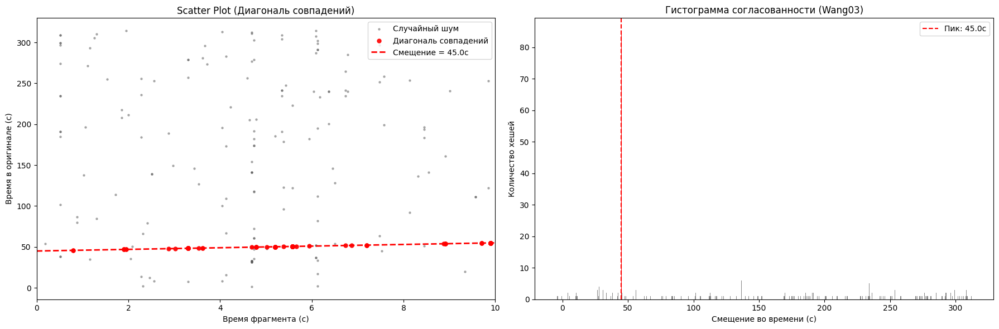

In [62]:
# графики
if best_tid is not None and best_score >= MATCH_THRESHOLD:
    fig = plt.figure(figsize=(18, 6))
    gs = gridspec.GridSpec(1, 2, figure=fig)
    
    # Фильтруем точки только для победившего трека
    t_q_sec = [q * HOP_FINAL / TARGET_SR for tid, q, db in scatter_points if tid == best_tid]
    t_db_sec = [db * HOP_FINAL / TARGET_SR for tid, q, db in scatter_points if tid == best_tid]
    t_q_sec, t_db_sec = np.array(t_q_sec), np.array(t_db_sec)
    
    # График 1: Scatter Plot
    ax_scatter = fig.add_subplot(gs[0, 0])
    ax_scatter.scatter(t_q_sec, t_db_sec, c='#555555', s=5, alpha=0.4, label='Случайный шум')
    
    tol = 0.5
    mask = np.abs((t_db_sec - t_q_sec) - found_time) < tol
    ax_scatter.scatter(t_q_sec[mask], t_db_sec[mask], c='red', s=25, alpha=0.9, label='Диагональ совпадений')
    
    t_r = np.linspace(0, Q_DUR, 100)
    ax_scatter.plot(t_r, t_r + found_time, 'r--', linewidth=2, label=f'Смещение = {found_time:.1f}с')
    ax_scatter.set(xlabel='Время фрагмента (с)', ylabel=f'Время в оригинале (с)', title='Scatter Plot (Диагональ совпадений)', xlim=(0, Q_DUR))
    ax_scatter.legend()
    
    #График 2: Гистограмма
    ax_hist = fig.add_subplot(gs[0, 1])
    dt_sec = np.array(matches[best_tid]) * HOP_FINAL / TARGET_SR
    bins = np.arange(dt_sec.min()-1, dt_sec.max() + 1, 0.5)
    counts, edges, patches = ax_hist.hist(dt_sec, bins=bins, color='#555555', alpha=0.7)
    
    peak_idx = np.abs(edges[:-1] - found_time).argmin()
    if peak_idx < len(patches):
        patches[peak_idx].set_facecolor('red')
        patches[peak_idx].set_alpha(1.0)
    ax_hist.axvline(found_time, color='red', linestyle='--', label=f'Пик: {found_time:.1f}с')
    ax_hist.set(xlabel='Смещение во времени (с)', ylabel='Количество хешей', title='Гистограмма согласованности (Wang03)')
    ax_hist.legend()
    
    plt.tight_layout()
    plt.show()

In [63]:
# Этот блок работает, если в Блоке 5 мы уже загрузили модель в переменную `model`
if best_tid is not None and best_score >= MATCH_THRESHOLD and 'model' in globals():
    print("\n[AI] Запуск семантической проверки OpenL3...")
    
    # вектор зашумленного фрагмента
    emb_q, _, _ = get_track_embedding(y_query, TARGET_SR, model_obj=model, hop_size=HOP_SIZE, aggregate="mean")
    q_vec = emb_q.reshape(1, -1)
    
    # вектор оригинала (вырезаем кусок ровно с найденной отметки)
    orig_path = TRACK_REGISTRY[best_tid]['path']
    y_orig, _ = librosa.load(orig_path, sr=TARGET_SR, offset=found_time, duration=Q_DUR)
    emb_orig, _, _ = get_track_embedding(y_orig, TARGET_SR, model_obj=model, hop_size=HOP_SIZE, aggregate="mean")
    orig_vec = emb_orig.reshape(1, -1)
    
    # 3. Сравниваем векторы
    similarity = cosine_similarity(q_vec, orig_vec)[0][0] * 100
    
    print(f"Косинусное сходство фрагментов: {similarity:.1f}%")
    if similarity > 70.0:
        print("ВЕРДИКТ: Нейросеть полностью подтверждает правильность распознавания!")
    else:
        print("ВЕРДИКТ: Алгоритм Ванга нашел совпадения, но нейросеть сомневается (сильный шум или ложное срабатывание).")


[AI] Запуск семантической проверки OpenL3...
Косинусное сходство фрагментов: 96.1%
ВЕРДИКТ: Нейросеть полностью подтверждает правильность распознавания!


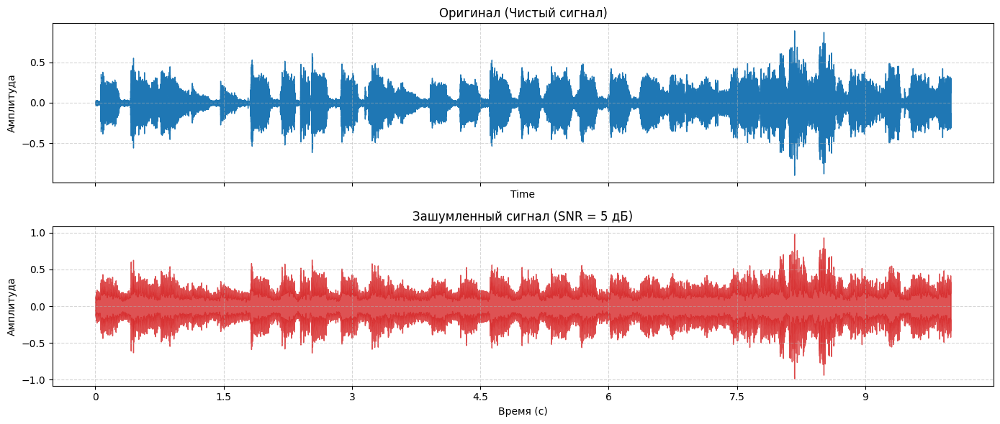

In [64]:
import matplotlib.pyplot as plt
import numpy as np
import librosa
import librosa.display

# Если переменные TARGET_SR и SELECTED_FILE еще в памяти, используем их
# Вырезаем 10 секунд чистого аудио для примера
y_clean, sr = librosa.load(SELECTED_FILE, sr=TARGET_SR, offset=45.0, duration=10.0)

# Наша функция добавления шума
def add_white_noise(y, snr_db):
    signal_power = np.mean(y**2)
    noise_power = signal_power / (10 ** (snr_db / 10))
    noise = np.random.normal(0, np.sqrt(noise_power), len(y))
    return y + noise

# Генерируем шум ровно 5 дБ
snr_target = 5
y_noisy_5db = add_white_noise(y_clean, snr_db=snr_target)

# Отрисовка красивого графика для курсовой
fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(14, 6))

librosa.display.waveshow(y_clean, sr=sr, ax=ax[0], color='#1f77b4')
ax[0].set(title='Оригинал (Чистый сигнал)', ylabel='Амплитуда')
ax[0].grid(True, linestyle='--', alpha=0.5)

librosa.display.waveshow(y_noisy_5db, sr=sr, ax=ax[1], color='#d62728', alpha=0.8)
ax[1].set(title=f'Зашумленный сигнал (SNR = {snr_target} дБ)', xlabel='Время (с)', ylabel='Амплитуда')
ax[1].grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()